   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 584.2/584.2 kB 31.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 10.3 MB/s eta 0:00:00


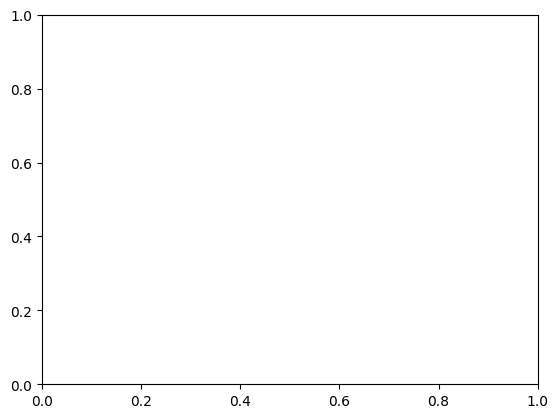

In [3]:
# Data Manipulation
import numpy as np
import pandas as pd

# Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.gridspec as gridspec
plt.grid(False)  # Disable the grid
import plotly.offline as py
import plotly.express as px

py.init_notebook_mode(connected=True)  # To work offline in Google Colab

# Install and import lifetimes library
!pip install lifetimes
import lifetimes

import os
import warnings
from datetime import datetime

# Set the random seed so as to reproduce results
import random
random.seed(42)
np.random.seed(42)

# Set Options
pd.set_option('display.max_rows', 800)
pd.set_option('display.max_columns', 500)
pd.set_option('expand_frame_repr', False)
%matplotlib inline
warnings.filterwarnings("ignore")


In [2]:
# Load data
customers = pd.read_csv('/content/olist_customers_dataset.csv')
orders = pd.read_csv('/content/olist_orders_dataset.csv')
payments = pd.read_csv('/content/olist_order_payments_dataset.csv')
order_items = pd.read_csv('/content/olist_order_items_dataset.csv')


In [4]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [5]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [6]:
order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [7]:
payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [8]:
# Dimensions
print('Dimensions of customer data', customers.shape)
customers.head()

Dimensions of customer data (99441, 5)


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [9]:
# Summary
customers.describe()

,customer_zip_code_prefix
count,99441.000000
mean,35137.474583
std,29797.938996
min,1003.000000
25%,11347.000000
50%,24416.000000
75%,58900.000000
max,99990.000000


In [10]:
def get_stats(df):
    """Stats of dataset"""
    stats = []
    for col in df.columns:
        stats.append((col,
                      df[col].nunique(),
                      df[col].isnull().sum() * 100 / df.shape[0],
                      df[col].value_counts(normalize=True, dropna=False).values[0] * 100,
                      df[col].dtype))
    stats_df = pd.DataFrame(stats, columns=['Feature', 'Unique_values', 'Percentage of missing values', 'Percentage of values in the biggest category', 'type'])
    return stats_df

In [11]:
stats_df = get_stats(customers)
stats_df.sort_values('Percentage of missing values', ascending=False)

,Feature,Unique_values,Percentage of missing values,Percentage of values in the biggest category,type
0,customer_id,99441,0.0,0.001006,object
1,customer_unique_id,96096,0.0,0.017096,object
2,customer_zip_code_prefix,14994,0.0,0.142798,int64
3,customer_city,4119,0.0,15.627357,object
4,customer_state,27,0.0,41.980672,object


In [12]:
# View the top 5 states
customers["customer_state"].value_counts(normalize=True, dropna=False).head()

,proportion
customer_state,
SP,0.419807
RJ,0.129242
MG,0.117004
RS,0.054967
PR,0.050734


In [13]:
# Dimensions
print('Dimensions of orders data', orders.shape)
orders.head()

Dimensions of orders data (99441, 8)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [14]:
# Summary
orders.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2018-04-11 10:48:14,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-08 23:38:46,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


In [15]:
stats_df = get_stats(orders)
stats_df.sort_values('Percentage of missing values', ascending=False)

,Feature,Unique_values,Percentage of missing values,Percentage of values in the biggest category,type
6,order_delivered_customer_date,95664,2.981668,2.981668,object
5,order_delivered_carrier_date,81018,1.793023,1.793023,object
4,order_approved_at,90733,0.160899,0.160899,object
0,order_id,99441,0.000000,0.001006,object
1,customer_id,99441,0.000000,0.001006,object
2,order_status,8,0.000000,97.020344,object
3,order_purchase_timestamp,98875,0.000000,0.003017,object
7,order_estimated_delivery_date,459,0.000000,0.524934,object


In [16]:
# Dimensions
print('Dimensions of orders data', order_items.shape)
order_items.head()

Dimensions of orders data (112650, 7)


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [17]:
# Summary
order_items.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


In [18]:
stats_df = get_stats(order_items)
stats_df.sort_values('Percentage of missing values', ascending=False)

,Feature,Unique_values,Percentage of missing values,Percentage of values in the biggest category,type
0,order_id,98666,0.0,0.018642,object
1,order_item_id,21,0.0,87.586329,int64
2,product_id,32951,0.0,0.467821,object
3,seller_id,3095,0.0,1.804705,object
4,shipping_limit_date,93318,0.0,0.018642,object
5,price,5968,0.0,2.202397,float64
6,freight_value,6999,0.0,3.290723,float64


In [19]:
# Dimensions
print('Dimensions of orders data', payments.shape)
payments.head()

Dimensions of orders data (103886, 5)


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [20]:
# Summary
payments.describe()

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


In [21]:
stats_df = get_stats(payments)
stats_df.sort_values('Percentage of missing values', ascending=False)

,Feature,Unique_values,Percentage of missing values,Percentage of values in the biggest category,type
0,order_id,99440,0.0,0.027915,object
1,payment_sequential,29,0.0,95.643301,int64
2,payment_type,5,0.0,73.922376,object
3,payment_installments,24,0.0,50.580444,int64
4,payment_value,29077,0.0,0.311880,float64


In [22]:
# creating master dataframe
df1 = payments.merge(order_items, on='order_id')
df2 = df1.merge(orders, on='order_id')
df = df2.merge(customers, on='customer_id')
print(df.shape)

(117601, 22)


In [23]:
df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,19.53,0a8556ac6be836b46b3e89920d59291c,delivered,2018-04-25 22:01:49,2018-04-25 22:15:09,2018-05-02 15:20:00,2018-05-09 17:36:51,2018-05-22 00:00:00,708ab75d2a007f0564aedd11139c7708,39801,teofilo otoni,MG
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39,1,a630cc320a8c872f9de830cf121661a3,eaf6d55068dea77334e8477d3878d89e,2018-07-02 11:18:58,17.00,7.39,f2c7fc58a9de810828715166c672f10a,delivered,2018-06-26 11:01:38,2018-06-26 11:18:58,2018-06-28 14:18:00,2018-06-29 20:32:09,2018-07-16 00:00:00,a8b9d3a27068454b1c98cc67d4e31e6f,2422,sao paulo,SP
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-12-26 09:52:34,56.99,8.72,25b14b69de0b6e184ae6fe2755e478f9,delivered,2017-12-12 11:19:55,2017-12-14 09:52:34,2017-12-15 20:13:22,2017-12-18 17:24:41,2018-01-04 00:00:00,6f70c0b2f7552832ba46eb57b1c5651e,2652,sao paulo,SP
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78,1,548e5bfe28edceab6b51fa707cc9556f,da8622b14eb17ae2831f4ac5b9dab84a,2017-12-12 12:13:20,89.90,17.88,7a5d8efaaa1081f800628c30d2b0728f,delivered,2017-12-06 12:04:06,2017-12-06 12:13:20,2017-12-07 20:28:28,2017-12-21 01:35:51,2018-01-04 00:00:00,87695ed086ebd36f20404c82d20fca87,36060,juiz de fora,MG
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45,1,386486367c1f9d4f587a8864ccb6902b,cca3071e3e9bb7d12640c9fbe2301306,2018-05-31 16:14:41,113.57,14.88,15fd6fb8f8312dbb4674e4518d6fa3b3,delivered,2018-05-21 13:59:17,2018-05-21 16:14:41,2018-05-22 11:46:00,2018-06-01 21:44:53,2018-06-13 00:00:00,4291db0da71914754618cd789aebcd56,18570,conchas,SP


In [24]:
df.dtypes

,0
order_id,object
payment_sequential,int64
payment_type,object
payment_installments,int64
payment_value,float64
order_item_id,int64
product_id,object
seller_id,object
shipping_limit_date,object
price,float64


In [25]:
# converting date columns to datetime
date_columns = ['shipping_limit_date', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date']
for col in date_columns:
    df[col] = pd.to_datetime(df[col], format='%Y-%m-%d %H:%M:%S')

In [26]:
df[['shipping_limit_date',
   'order_purchase_timestamp',
   'order_approved_at',
   'order_delivered_carrier_date',
   'order_delivered_customer_date',
   'order_estimated_delivery_date']].dtypes

,0
shipping_limit_date,datetime64[ns]
order_purchase_timestamp,datetime64[ns]
order_approved_at,datetime64[ns]
order_delivered_carrier_date,datetime64[ns]
order_delivered_customer_date,datetime64[ns]
order_estimated_delivery_date,datetime64[ns]


In [27]:
# cleaning up name columns
df['customer_city'] = df['customer_city'].str.title()
df['payment_type'] = df['payment_type'].str.replace('_', ' ').str.title()  # Optional
# engineering new/essential columns
df['order_date'] = pd.to_datetime(df['order_purchase_timestamp'], format = '%Y-%m-%d')


In [28]:
df['delivery_against_estimated'] = (df['order_estimated_delivery_date'] - df['order_delivered_customer_date']).dt.days
df['order_purchase_year']        = df.order_purchase_timestamp.apply(lambda x: x.year)
df['order_purchase_month']       = df.order_purchase_timestamp.apply(lambda x: x.month)
df['order_purchase_dayofweek']   = df.order_purchase_timestamp.apply(lambda x: x.dayofweek)
df['order_purchase_hour']        = df.order_purchase_timestamp.apply(lambda x: x.hour)
df['order_purchase_day']         = df['order_purchase_dayofweek'].map({0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'})
df['order_purchase_mon']         = df.order_purchase_timestamp.apply(lambda x: x.month).map({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})

# Changing the month attribute for correct ordenation
df['month_year']                 = df['order_purchase_month'].astype(str).apply(lambda x: '0' + x if len(x) == 1 else x)
df['month_year']                 = df['order_purchase_year'].astype(str) + '-' + df['month_year'].astype(str)

# creating year month column
df['month_y']                    = df['order_purchase_timestamp'].map(lambda date: 100*date.year + date.month)

In [29]:
df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_date,delivery_against_estimated,order_purchase_year,order_purchase_month,order_purchase_dayofweek,order_purchase_hour,order_purchase_day,order_purchase_mon,month_year,month_y
0,b81ef226f3fe1789b1e8b2acac839d17,1,Credit Card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,19.53,0a8556ac6be836b46b3e89920d59291c,delivered,2018-04-25 22:01:49,2018-04-25 22:15:09,2018-05-02 15:20:00,2018-05-09 17:36:51,2018-05-22,708ab75d2a007f0564aedd11139c7708,39801,Teofilo Otoni,MG,2018-04-25 22:01:49,12.0,2018,4,2,22,Wed,Apr,2018-04,201804
1,a9810da82917af2d9aefd1278f1dcfa0,1,Credit Card,1,24.39,1,a630cc320a8c872f9de830cf121661a3,eaf6d55068dea77334e8477d3878d89e,2018-07-02 11:18:58,17.00,7.39,f2c7fc58a9de810828715166c672f10a,delivered,2018-06-26 11:01:38,2018-06-26 11:18:58,2018-06-28 14:18:00,2018-06-29 20:32:09,2018-07-16,a8b9d3a27068454b1c98cc67d4e31e6f,2422,Sao Paulo,SP,2018-06-26 11:01:38,16.0,2018,6,1,11,Tue,Jun,2018-06,201806
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,Credit Card,1,65.71,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-12-26 09:52:34,56.99,8.72,25b14b69de0b6e184ae6fe2755e478f9,delivered,2017-12-12 11:19:55,2017-12-14 09:52:34,2017-12-15 20:13:22,2017-12-18 17:24:41,2018-01-04,6f70c0b2f7552832ba46eb57b1c5651e,2652,Sao Paulo,SP,2017-12-12 11:19:55,16.0,2017,12,1,11,Tue,Dec,2017-12,201712
3,ba78997921bbcdc1373bb41e913ab953,1,Credit Card,8,107.78,1,548e5bfe28edceab6b51fa707cc9556f,da8622b14eb17ae2831f4ac5b9dab84a,2017-12-12 12:13:20,89.90,17.88,7a5d8efaaa1081f800628c30d2b0728f,delivered,2017-12-06 12:04:06,2017-12-06 12:13:20,2017-12-07 20:28:28,2017-12-21 01:35:51,2018-01-04,87695ed086ebd36f20404c82d20fca87,36060,Juiz De Fora,MG,2017-12-06 12:04:06,13.0,2017,12,2,12,Wed,Dec,2017-12,201712
4,42fdf880ba16b47b59251dd489d4441a,1,Credit Card,2,128.45,1,386486367c1f9d4f587a8864ccb6902b,cca3071e3e9bb7d12640c9fbe2301306,2018-05-31 16:14:41,113.57,14.88,15fd6fb8f8312dbb4674e4518d6fa3b3,delivered,2018-05-21 13:59:17,2018-05-21 16:14:41,2018-05-22 11:46:00,2018-06-01 21:44:53,2018-06-13,4291db0da71914754618cd789aebcd56,18570,Conchas,SP,2018-05-21 13:59:17,11.0,2018,5,0,13,Mon,May,2018-05,201805


In [30]:
# displaying summary staticstics of columns
df.describe(include='all')

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_date,delivery_against_estimated,order_purchase_year,order_purchase_month,order_purchase_dayofweek,order_purchase_hour,order_purchase_day,order_purchase_mon,month_year,month_y
count,117601,117601.000000,117601,117601.000000,117601.000000,117601.000000,117601,117601,117601,117601.000000,117601.000000,117601,117601,117601,117586,116356,115034,117601,117601,117601.000000,117601,117601,117601,115034.000000,117601.000000,117601.000000,117601.000000,117601.000000,117601,117601,117601,117601.000000
unique,98665,NaN,4,NaN,NaN,NaN,32951,3095,NaN,NaN,NaN,98665,7,NaN,NaN,NaN,NaN,NaN,95419,NaN,4110,27,NaN,NaN,NaN,NaN,NaN,NaN,7,12,24,NaN
top,895ab968e7bb0d5659d16cd74cd1650c,NaN,Credit Card,NaN,NaN,NaN,aca2eb7d00ea1a7b8ebd4e68314663af,4a3ca9315b744ce9f8e9374361493884,NaN,NaN,NaN,270c23a11d024a44c896d1894b261a83,delivered,NaN,NaN,NaN,NaN,NaN,9a736b248f67d166d2fbb006bcb877c3,NaN,Sao Paulo,SP,NaN,NaN,NaN,NaN,NaN,NaN,Mon,Aug,2017-11,NaN
freq,63,NaN,86769,NaN,NaN,NaN,536,2133,NaN,NaN,NaN,63,115035,NaN,NaN,NaN,NaN,NaN,75,NaN,18590,49566,NaN,NaN,NaN,NaN,NaN,NaN,19130,12632,9016,NaN
mean,NaN,1.093528,NaN,2.939482,172.686752,1.195900,NaN,NaN,2018-01-06 07:44:03.344223232,120.824783,20.045990,NaN,NaN,2017-12-30 16:19:35.878368256,2017-12-31 03:47:56.832505600,2018-01-03 18:13:17.468819712,2018-01-13 06:45:43.565711104,2018-01-23 12:55:57.155126016,NaN,35051.793097,NaN,NaN,2017-12-30 16:19:35.878368256,11.043326,2017.538193,6.028129,2.745750,14.760002,NaN,NaN,NaN,201759.847399
min,NaN,1.000000,NaN,0.000000,0.000000,1.000000,NaN,NaN,2016-09-19 00:15:34,0.850000,0.000000,NaN,NaN,2016-09-04 21:15:19,2016-10-04 09:43:32,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-20 00:00:00,NaN,1003.000000,NaN,NaN,2016-09-04 21:15:19,-189.000000,2016.000000,1.000000,0.000000,0.000000,NaN,NaN,NaN,201609.000000
25%,NaN,1.000000,NaN,1.000000,60.870000,1.000000,NaN,NaN,2017-09-18 22:15:28,39.900000,13.080000,NaN,NaN,2017-09-11 21:42:39,2017-09-12 11:11:34,2017-09-14 23:09:42,2017-09-25 14:09:30.249999872,2017-10-03 00:00:00,NaN,11310.000000,NaN,NaN,2017-09-11 21:42:39,6.000000,2017.000000,3.000000,1.000000,11.000000,NaN,NaN,NaN,201709.000000
50%,NaN,1.000000,NaN,2.000000,108.210000,1.000000,NaN,NaN,2018-01-25 11:57:49,74.900000,16.290000,NaN,NaN,2018-01-18 13:37:27,2018-01-18 20:14:08,2018-01-23 20:43:30,2018-02-01 19:17:46,2018-02-14 00:00:00,NaN,24315.000000,NaN,NaN,2018-01-18 13:37:27,12.000000,2018.000000,6.000000,3.000000,15.000000,NaN,NaN,NaN,201801.000000
75%,NaN,1.000000,NaN,4.000000,189.260000,1.000000,NaN,NaN,2018-05-10 07:51:17,134.900000,21.190000,NaN,NaN,2018-05-03 22:43:17,2018-05-04 11:35:16.750000128,2018-05-07 16:34:00,2018-05-15 16:52:09.249999872,2018-05-25 00:00:00,NaN,58600.000000,NaN,NaN,2018-05-03 22:43:17,16.000000,2018.000000,8.000000,4.000000,19.000000,NaN,NaN,NaN,201805.000000
max,NaN,29.000000,NaN,24.000000,13664.080000,21.000000,NaN,NaN,2020-04-09 22:35:08,6735.000000,409.680000,NaN,NaN,2018-09-03 09:06:57,2018-09-03 17:40:06,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00,NaN,99990.000000,NaN,NaN,2018-09-03 09:06:57,146.000000,2018.000000,12.000000,6.000000,23.000000,NaN,NaN,NaN,201809.000000


In [31]:
stats_df = get_stats(df)
stats_df.sort_values('Percentage of missing values', ascending=False)

,Feature,Unique_values,Percentage of missing values,Percentage of values in the biggest category,type
16,order_delivered_customer_date,95663,2.182805,2.182805,datetime64[ns]
23,delivery_against_estimated,198,2.182805,7.279700,float64
15,order_delivered_carrier_date,81016,1.058664,1.058664,datetime64[ns]
14,order_approved_at,90173,0.012755,0.053571,datetime64[ns]
19,customer_zip_code_prefix,14976,0.000000,0.134353,int64
20,customer_city,4110,0.000000,15.807689,object
21,customer_state,27,0.000000,42.147601,object
22,order_date,98111,0.000000,0.053571,datetime64[ns]
24,order_purchase_year,3,0.000000,54.146648,int64
17,order_estimated_delivery_date,449,0.000000,0.551866,datetime64[ns]


In [32]:
# dropping missing values
df.dropna(inplace=True)
df.isnull().values.any()

False

In [33]:
# displaying dataframe info
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 115018 entries, 0 to 117600
Data columns (total 32 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       115018 non-null  object        
 1   payment_sequential             115018 non-null  int64         
 2   payment_type                   115018 non-null  object        
 3   payment_installments           115018 non-null  int64         
 4   payment_value                  115018 non-null  float64       
 5   order_item_id                  115018 non-null  int64         
 6   product_id                     115018 non-null  object        
 7   seller_id                      115018 non-null  object        
 8   shipping_limit_date            115018 non-null  datetime64[ns]
 9   price                          115018 non-null  float64       
 10  freight_value                  115018 non-null  float64       
 11  custo

In [35]:
df.to_csv("df_full.csv", index=False)

In [36]:
# defining visualizaition functions
def format_spines(ax, right_border=True):
    """Format the graphs"""
    ax.spines['bottom'].set_color('#666666')
    ax.spines['left'].set_color('#666666')
    ax.spines['top'].set_visible(False)
    if right_border:
        ax.spines['right'].set_color('#FFFFFF')
    else:
        ax.spines['right'].set_color('#FFFFFF')
    ax.patch.set_facecolor('#FFFFFF')


def count_plot(feature, df, colors='Blues_d', hue=False, ax=None, title=''):
    """Count Plot"""
    # Preparing variables
    ncount = len(df)
    if hue != False:
        ax = sns.countplot(x=feature, data=df, palette=colors, hue=hue, ax=ax)
    else:
        ax = sns.countplot(x=feature, data=df, palette=colors, ax=ax)

    format_spines(ax)

    # Setting percentage
    for p in ax.patches:
        x=p.get_bbox().get_points()[:,0]
        y=p.get_bbox().get_points()[1,1]
        ax.annotate('{:.1f}%'.format(100.*y/ncount), (x.mean(), y),
                ha='center', va='bottom') # set the alignment of the text

    # Final configuration
    if not hue:
        ax.set_title(df[feature].describe().name + ' Analysis', size=13, pad=15)
    else:
        ax.set_title(df[feature].describe().name + ' Analysis by ' + hue, size=13, pad=15)
    if title != '':
        ax.set_title(title)
    plt.tight_layout()


def bar_plot(x, y, df, colors='Blues_d', hue=False, ax=None, value=False, title=''):

    # Preparing variables
    try:
        ncount = sum(df[y])
    except:
        ncount = sum(df[x])
    #fig, ax = plt.subplots()
    if hue != False:
        ax = sns.barplot(x=x, y=y, data=df, palette=colors, hue=hue, ax=ax, ci=None)
    else:
        ax = sns.barplot(x=x, y=y, data=df, palette=colors, ax=ax, ci=None)

    # Setting borders
    format_spines(ax)

    # Setting percentage
    for p in ax.patches:
        xp=p.get_bbox().get_points()[:,0]
        yp=p.get_bbox().get_points()[1,1]
        if value:
            ax.annotate('{:.2f}k'.format(yp/1000), (xp.mean(), yp),
                    ha='center', va='bottom') # set the alignment of the text
        else:
            ax.annotate('{:.1f}%'.format(100.*yp/ncount), (xp.mean(), yp),
                    ha='center', va='bottom') # set the alignment of the text
    if not hue:
        ax.set_title(df[x].describe().name + ' Analysis', size=12, pad=15)
    else:
        ax.set_title(df[x].describe().name + ' Analysis by ' + hue, size=12, pad=15)
    if title != '':
        ax.set_title(title)
    plt.tight_layout()

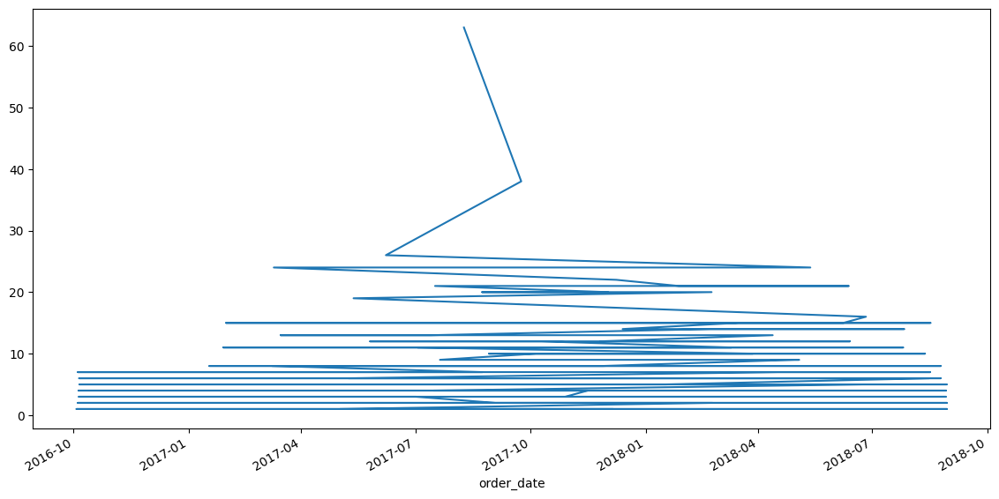

In [37]:
# order count by date
plt.figure(figsize = (14,7))
df.order_date.value_counts().plot();

Text(0.5, 1.0, 'Sales per day')

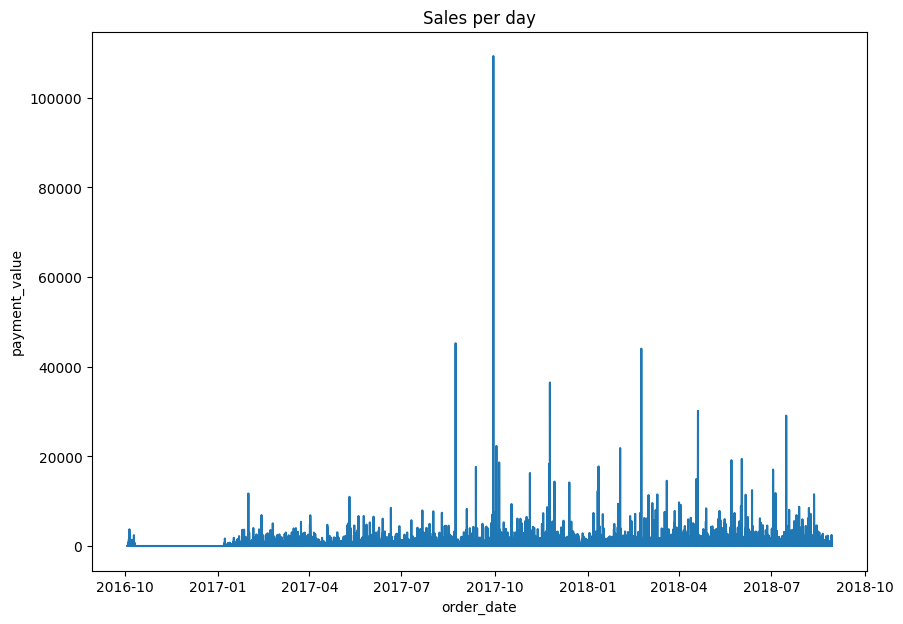

In [38]:
# creating an aggregation
plt.figure(figsize = (10,7))
sales_per_purchase_date = df.groupby('order_date', as_index=False).payment_value.sum()
ax = sns.lineplot(x="order_date", y="payment_value", data=sales_per_purchase_date)
ax.set_title('Sales per day')

In [39]:
# calculate Revenue for each row and create a new dataframe with YearMonth - Revenue columns
df_revenue = df.groupby(['month_year'])['payment_value'].sum().reset_index()
df_revenue

,month_year,payment_value
0,2016-10,62591.65
1,2016-12,19.62
2,2017-01,176376.56
3,2017-02,323815.95
4,2017-03,505735.83
5,2017-04,456108.32
6,2017-05,701119.60
7,2017-06,585400.98
8,2017-07,716069.98
9,2017-08,842689.94


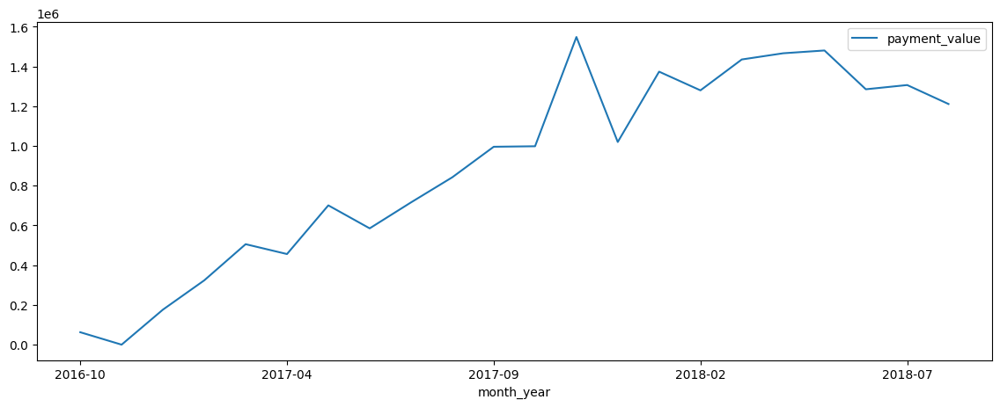

In [40]:
df_revenue.plot(x="month_year", y="payment_value", figsize=(14,5));

In [41]:
#calculating for monthly revenie growth rate
# using pct_change() function to see monthly percentage change
df_revenue['MonthlyGrowth'] = df_revenue['payment_value'].pct_change()

df_revenue

,month_year,payment_value,MonthlyGrowth
0,2016-10,62591.65,NaN
1,2016-12,19.62,-0.999687
2,2017-01,176376.56,8988.630989
3,2017-02,323815.95,0.835935
4,2017-03,505735.83,0.561800
5,2017-04,456108.32,-0.098129
6,2017-05,701119.60,0.537178
7,2017-06,585400.98,-0.165048
8,2017-07,716069.98,0.223213
9,2017-08,842689.94,0.176826


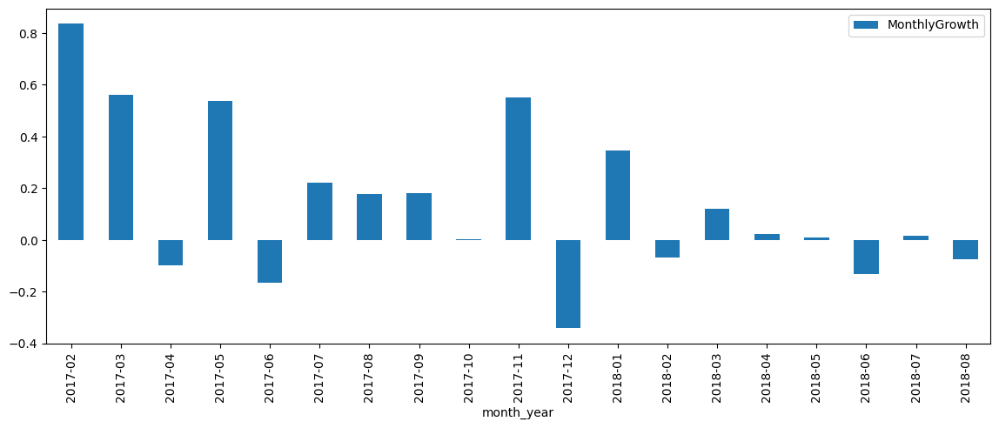

In [42]:
df_revenue.iloc[3:, :].plot.bar(x="month_year", y="MonthlyGrowth", figsize=(14,5));

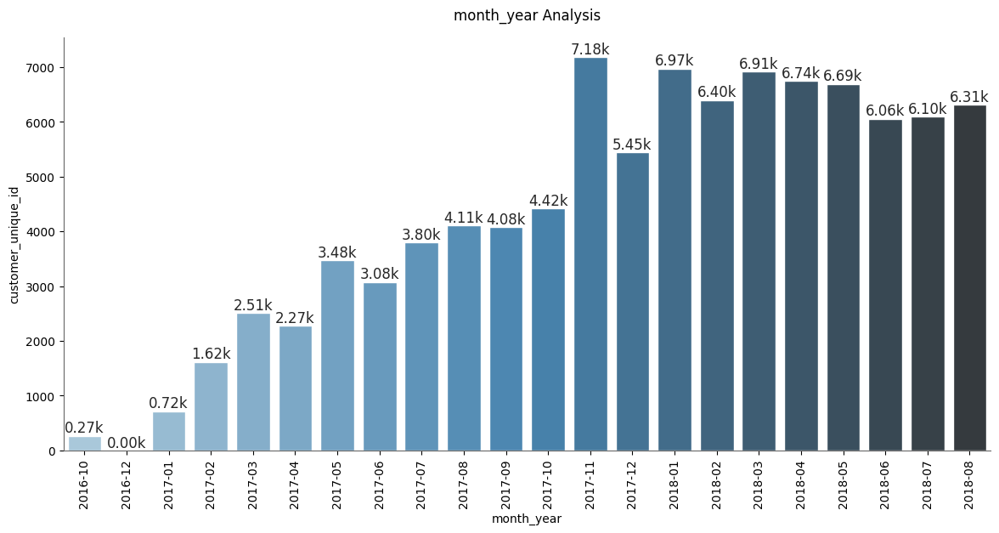

In [43]:
# creating monthly active customers dataframe by counting unique Customer IDs
df_monthly_active = df.groupby('month_year')['customer_unique_id'].nunique().reset_index()

fig, ax = plt.subplots(figsize=(12, 6))
sns.set(palette='muted', color_codes=True, style='whitegrid')
bar_plot(x='month_year', y='customer_unique_id', df=df_monthly_active, value=True)
ax.tick_params(axis='x', labelrotation=90)
plt.show()

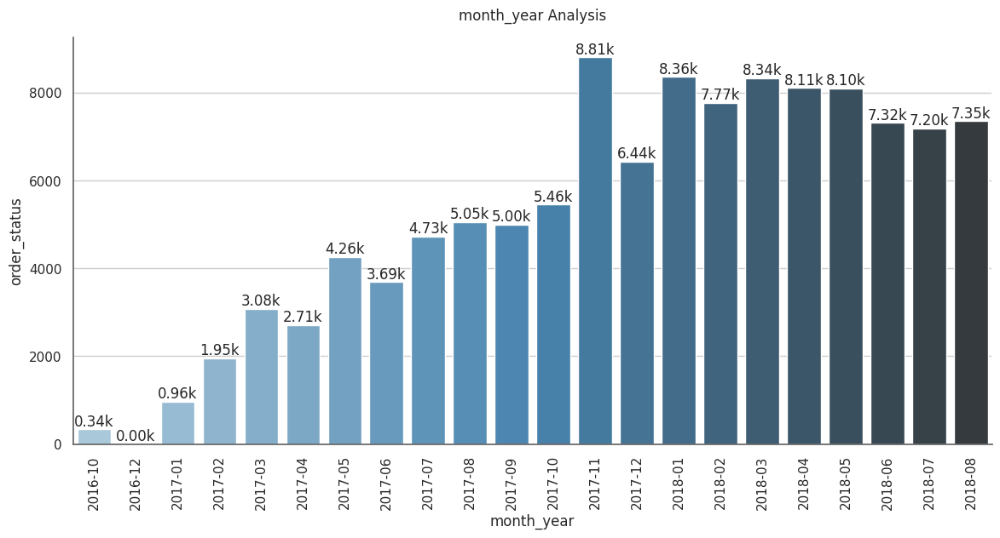

In [44]:
#creating monthly active customers dataframe by counting unique Customer IDs
df_monthly_sales = df.groupby('month_year')['order_status'].count().reset_index()

fig, ax = plt.subplots(figsize=(12, 6))
sns.set(palette='muted', color_codes=True, style='whitegrid')
bar_plot(x='month_year', y='order_status', df=df_monthly_sales, value=True)
ax.tick_params(axis='x', labelrotation=90)
plt.show()

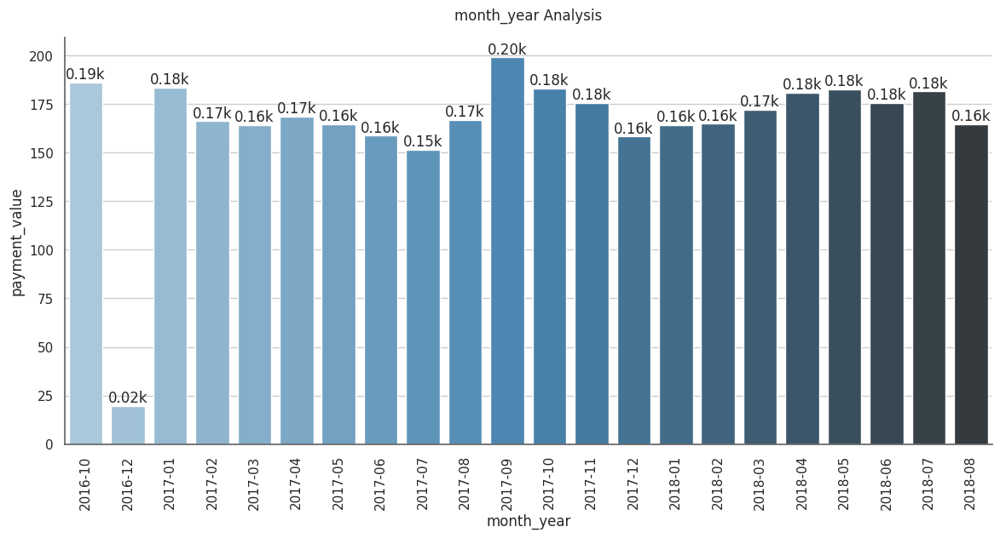

In [45]:
# create a new dataframe for average revenue by taking the mean of it
df_monthly_order_avg = df.groupby('month_year')['payment_value'].mean().reset_index()

fig, ax = plt.subplots(figsize=(12, 6))
sns.set(palette='muted', color_codes=True, style='whitegrid')
bar_plot(x='month_year', y='payment_value', df=df_monthly_order_avg, value=True)
ax.tick_params(axis='x', labelrotation=90)
plt.show()

In [46]:
# Create a dataframe contaning CustomerID and first purchase date
df_min_purchase = df.groupby('customer_unique_id').order_purchase_timestamp.min().reset_index()  # earliest purchase date for each customer
df_min_purchase.columns = ['customer_unique_id','minpurchasedate']
df_min_purchase['minpurchasedate'] = df_min_purchase['minpurchasedate'].map(lambda date: 100*date.year + date.month)

# Merge first purchase date column to our main dataframe (tx_uk)
df = pd.merge(df, df_min_purchase, on='customer_unique_id')
df.head(7)

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_date,delivery_against_estimated,order_purchase_year,order_purchase_month,order_purchase_dayofweek,order_purchase_hour,order_purchase_day,order_purchase_mon,month_year,month_y,minpurchasedate
0,b81ef226f3fe1789b1e8b2acac839d17,1,Credit Card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,19.53,0a8556ac6be836b46b3e89920d59291c,delivered,2018-04-25 22:01:49,2018-04-25 22:15:09,2018-05-02 15:20:00,2018-05-09 17:36:51,2018-05-22,708ab75d2a007f0564aedd11139c7708,39801,Teofilo Otoni,MG,2018-04-25 22:01:49,12.0,2018,4,2,22,Wed,Apr,2018-04,201804,201804
1,a9810da82917af2d9aefd1278f1dcfa0,1,Credit Card,1,24.39,1,a630cc320a8c872f9de830cf121661a3,eaf6d55068dea77334e8477d3878d89e,2018-07-02 11:18:58,17.00,7.39,f2c7fc58a9de810828715166c672f10a,delivered,2018-06-26 11:01:38,2018-06-26 11:18:58,2018-06-28 14:18:00,2018-06-29 20:32:09,2018-07-16,a8b9d3a27068454b1c98cc67d4e31e6f,2422,Sao Paulo,SP,2018-06-26 11:01:38,16.0,2018,6,1,11,Tue,Jun,2018-06,201806,201806
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,Credit Card,1,65.71,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-12-26 09:52:34,56.99,8.72,25b14b69de0b6e184ae6fe2755e478f9,delivered,2017-12-12 11:19:55,2017-12-14 09:52:34,2017-12-15 20:13:22,2017-12-18 17:24:41,2018-01-04,6f70c0b2f7552832ba46eb57b1c5651e,2652,Sao Paulo,SP,2017-12-12 11:19:55,16.0,2017,12,1,11,Tue,Dec,2017-12,201712,201712
3,ba78997921bbcdc1373bb41e913ab953,1,Credit Card,8,107.78,1,548e5bfe28edceab6b51fa707cc9556f,da8622b14eb17ae2831f4ac5b9dab84a,2017-12-12 12:13:20,89.90,17.88,7a5d8efaaa1081f800628c30d2b0728f,delivered,2017-12-06 12:04:06,2017-12-06 12:13:20,2017-12-07 20:28:28,2017-12-21 01:35:51,2018-01-04,87695ed086ebd36f20404c82d20fca87,36060,Juiz De Fora,MG,2017-12-06 12:04:06,13.0,2017,12,2,12,Wed,Dec,2017-12,201712,201712
4,42fdf880ba16b47b59251dd489d4441a,1,Credit Card,2,128.45,1,386486367c1f9d4f587a8864ccb6902b,cca3071e3e9bb7d12640c9fbe2301306,2018-05-31 16:14:41,113.57,14.88,15fd6fb8f8312dbb4674e4518d6fa3b3,delivered,2018-05-21 13:59:17,2018-05-21 16:14:41,2018-05-22 11:46:00,2018-06-01 21:44:53,2018-06-13,4291db0da71914754618cd789aebcd56,18570,Conchas,SP,2018-05-21 13:59:17,11.0,2018,5,0,13,Mon,May,2018-05,201805,201805
5,298fcdf1f73eb413e4d26d01b25bc1cd,1,Credit Card,2,96.12,1,eff40981f3d4639fb50c5dd51ac00d7a,640e21a7d01df7614a3b4923e990d40c,2018-05-11 15:31:11,34.35,13.71,a24e6f72471e9dbafcb292bc318f4859,delivered,2018-05-07 13:20:41,2018-05-07 15:31:14,2018-05-10 13:35:00,2018-05-14 19:02:54,2018-05-23,6e3c218d5f0434ddc4af3d6a60767bbf,13614,Leme,SP,2018-05-07 13:20:41,8.0,2018,5,0,13,Mon,May,2018-05,201805,201805
6,298fcdf1f73eb413e4d26d01b25bc1cd,1,Credit Card,2,96.12,2,eff40981f3d4639fb50c5dd51ac00d7a,640e21a7d01df7614a3b4923e990d40c,2018-05-11 15:31:11,34.35,13.71,a24e6f72471e9dbafcb292bc318f4859,delivered,2018-05-07 13:20:41,2018-05-07 15:31:14,2018-05-10 13:35:00,2018-05-14 19:02:54,2018-05-23,6e3c218d5f0434ddc4af3d6a60767bbf,13614,Leme,SP,2018-05-07 13:20:41,8.0,2018,5,0,13,Mon,May,2018-05,201805,201805


In [47]:
# create a column called User Type and assign Existing
# if User's First Purchase Year Month before the selected Invoice Year Month
df['usertype'] = 'New'
df.loc[df['month_y']>df['minpurchasedate'],'usertype'] = 'Existing'
df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_date,delivery_against_estimated,order_purchase_year,order_purchase_month,order_purchase_dayofweek,order_purchase_hour,order_purchase_day,order_purchase_mon,month_year,month_y,minpurchasedate,usertype
0,b81ef226f3fe1789b1e8b2acac839d17,1,Credit Card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,19.53,0a8556ac6be836b46b3e89920d59291c,delivered,2018-04-25 22:01:49,2018-04-25 22:15:09,2018-05-02 15:20:00,2018-05-09 17:36:51,2018-05-22,708ab75d2a007f0564aedd11139c7708,39801,Teofilo Otoni,MG,2018-04-25 22:01:49,12.0,2018,4,2,22,Wed,Apr,2018-04,201804,201804,New
1,a9810da82917af2d9aefd1278f1dcfa0,1,Credit Card,1,24.39,1,a630cc320a8c872f9de830cf121661a3,eaf6d55068dea77334e8477d3878d89e,2018-07-02 11:18:58,17.00,7.39,f2c7fc58a9de810828715166c672f10a,delivered,2018-06-26 11:01:38,2018-06-26 11:18:58,2018-06-28 14:18:00,2018-06-29 20:32:09,2018-07-16,a8b9d3a27068454b1c98cc67d4e31e6f,2422,Sao Paulo,SP,2018-06-26 11:01:38,16.0,2018,6,1,11,Tue,Jun,2018-06,201806,201806,New
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,Credit Card,1,65.71,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-12-26 09:52:34,56.99,8.72,25b14b69de0b6e184ae6fe2755e478f9,delivered,2017-12-12 11:19:55,2017-12-14 09:52:34,2017-12-15 20:13:22,2017-12-18 17:24:41,2018-01-04,6f70c0b2f7552832ba46eb57b1c5651e,2652,Sao Paulo,SP,2017-12-12 11:19:55,16.0,2017,12,1,11,Tue,Dec,2017-12,201712,201712,New
3,ba78997921bbcdc1373bb41e913ab953,1,Credit Card,8,107.78,1,548e5bfe28edceab6b51fa707cc9556f,da8622b14eb17ae2831f4ac5b9dab84a,2017-12-12 12:13:20,89.90,17.88,7a5d8efaaa1081f800628c30d2b0728f,delivered,2017-12-06 12:04:06,2017-12-06 12:13:20,2017-12-07 20:28:28,2017-12-21 01:35:51,2018-01-04,87695ed086ebd36f20404c82d20fca87,36060,Juiz De Fora,MG,2017-12-06 12:04:06,13.0,2017,12,2,12,Wed,Dec,2017-12,201712,201712,New
4,42fdf880ba16b47b59251dd489d4441a,1,Credit Card,2,128.45,1,386486367c1f9d4f587a8864ccb6902b,cca3071e3e9bb7d12640c9fbe2301306,2018-05-31 16:14:41,113.57,14.88,15fd6fb8f8312dbb4674e4518d6fa3b3,delivered,2018-05-21 13:59:17,2018-05-21 16:14:41,2018-05-22 11:46:00,2018-06-01 21:44:53,2018-06-13,4291db0da71914754618cd789aebcd56,18570,Conchas,SP,2018-05-21 13:59:17,11.0,2018,5,0,13,Mon,May,2018-05,201805,201805,New


In [48]:
#calculate the Revenue per month for each user type
df_user_type_revenue = df.groupby(['month_y','usertype', 'month_year'])['payment_value'].sum().reset_index()
df_user_type_revenue

,month_y,usertype,month_year,payment_value
0,201610,New,2016-10,62591.65
1,201612,New,2016-12,19.62
2,201701,Existing,2017-01,19.62
3,201701,New,2017-01,176356.94
4,201702,Existing,2017-02,111.07
5,201702,New,2017-02,323704.88
6,201703,Existing,2017-03,596.38
7,201703,New,2017-03,505139.45
8,201704,Existing,2017-04,2789.06
9,201704,New,2017-04,453319.26


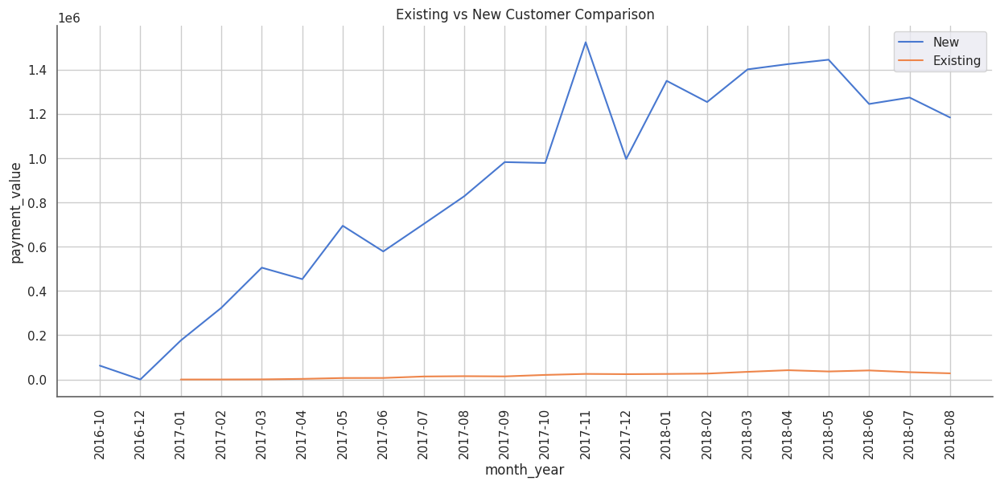

In [49]:
fig, ax = plt.subplots(figsize=(15, 6))
sns.set(palette='muted', color_codes=True)
ax = sns.lineplot(x='month_year', y='payment_value', data=df_user_type_revenue.query("usertype == 'New'"), label='New')
ax = sns.lineplot(x='month_year', y='payment_value', data=df_user_type_revenue.query("usertype == 'Existing'"), label='Existing')
format_spines(ax, right_border=False)
ax.set_title('Existing vs New Customer Comparison')
ax.tick_params(axis='x', labelrotation=90)
plt.show()

In [50]:
# Create a dataframe that shows new user ratio - we also need to drop NA values (first month new user ratio is 0)
df_user_ratio = df.query("usertype == 'Existing'").groupby(['month_year'])['customer_unique_id'].nunique() / df.query("usertype == 'New'").groupby(['month_year'])['customer_unique_id'].nunique()
df_user_ratio = df_user_ratio.reset_index()

#dropping nan values that resulted from first and last month
df_user_ratio = df_user_ratio.dropna()
df_user_ratio.columns = ['month_year','RepeatCusRatio']

#print the dafaframe
df_user_ratio

,month_year,RepeatCusRatio
2,2017-01,0.001399
3,2017-02,0.001238
4,2017-03,0.001998
5,2017-04,0.007979
6,2017-05,0.008116
7,2017-06,0.012842
8,2017-07,0.013326
9,2017-08,0.014050
10,2017-09,0.019735
11,2017-10,0.020328


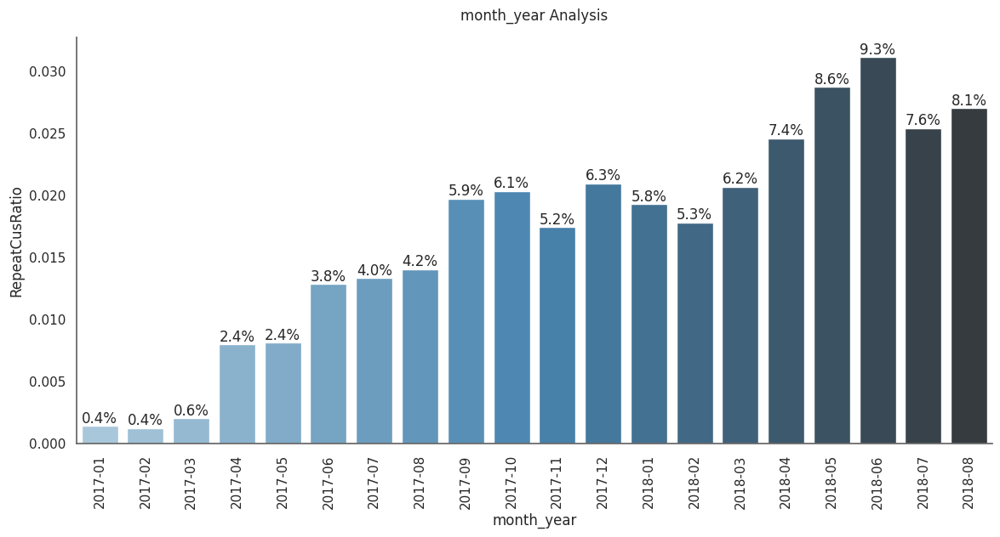

In [51]:
fig, ax = plt.subplots(figsize=(12, 6))
sns.set(palette='muted', color_codes=True, style='whitegrid')
bar_plot(x='month_year', y='RepeatCusRatio', df=df_user_ratio)
ax.tick_params(axis='x', labelrotation=90)
plt.show()

In [52]:
# Identifying active users are active by looking at their revenue per month
df_user_purchase = df.groupby(['customer_unique_id','month_y'])['payment_value'].sum().reset_index()
df_user_purchase.head()

,customer_unique_id,month_y,payment_value
0,0000366f3b9a7992bf8c76cfdf3221e2,201805,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,201805,27.19
2,0000f46a3911fa3c0805444483337064,201703,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,201710,43.62
4,0004aac84e0df4da2b147fca70cf8255,201711,196.89


In [53]:
# identifying active users are active by looking at their order count per month
df_user_purchase = df.groupby(['customer_unique_id','month_y'])['payment_value'].count().reset_index()
df_user_purchase.head()

,customer_unique_id,month_y,payment_value
0,0000366f3b9a7992bf8c76cfdf3221e2,201805,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,201805,1
2,0000f46a3911fa3c0805444483337064,201703,1
3,0000f6ccb0745a6a4b88665a16c9f078,201710,1
4,0004aac84e0df4da2b147fca70cf8255,201711,1


In [54]:
# create retention matrix with crosstab using purchase
df_retention = pd.crosstab(df_user_purchase['customer_unique_id'], df_user_purchase['month_y']).reset_index()
df_retention.head(10)

month_y,customer_unique_id,201610,201612,201701,201702,201703,201704,201705,201706,201707,201708,201709,201710,201711,201712,201801,201802,201803,201804,201805,201806,201807,201808
0,0000366f3b9a7992bf8c76cfdf3221e2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,0000f46a3911fa3c0805444483337064,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0000f6ccb0745a6a4b88665a16c9f078,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0004aac84e0df4da2b147fca70cf8255,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,0004bd2a26a76fe21f786e4fbd80607f,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
6,00050ab1314c0e55a6ca13cf7181fecf,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
7,00053a61a98854899e70ed204dd4bafe,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
8,0005e1862207bf6ccc02e4228effd9a0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0005ef4cd20d2893f0d9fbd94d3c0d97,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [55]:
# Creating an array of dictionary which keeps Retained & Total User count for each month
months = df_retention.columns[2:]
retention_array = []

for i in range(len(months)-1):
    retention_data = {}
    selected_month = months[i+1]
    prev_month = months[i]
    retention_data['month_y'] = int(selected_month)
    retention_data['TotalUserCount'] = df_retention[selected_month].sum()
    retention_data['RetainedUserCount'] = df_retention[(df_retention[selected_month]>0) & (df_retention[prev_month]>0)][selected_month].sum()
    retention_array.append(retention_data)

#convert the array to dataframe and calculate Retention Rate
df_retention = pd.DataFrame(retention_array)
df_retention['RetentionRate'] = df_retention['RetainedUserCount']/df_retention['TotalUserCount']

df_retention

,month_y,TotalUserCount,RetainedUserCount,RetentionRate
0,201701,716,1,0.001397
1,201702,1618,2,0.001236
2,201703,2508,3,0.001196
3,201704,2274,11,0.004837
4,201705,3478,14,0.004025
5,201706,3076,16,0.005202
6,201707,3802,16,0.004208
7,201708,4114,23,0.005591
8,201709,4082,32,0.007839
9,201710,4417,32,0.007245


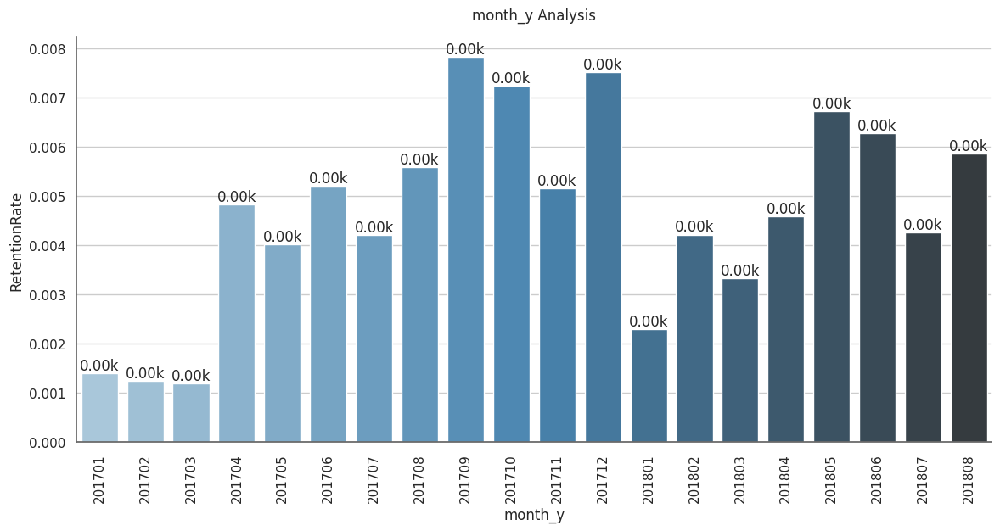

In [56]:
fig, ax = plt.subplots(figsize=(12, 6))
sns.set(palette='muted', color_codes=True, style='whitegrid')
bar_plot(x='month_y', y='RetentionRate', df=df_retention, value=True)
ax.tick_params(axis='x', labelrotation=90)
plt.show()

In [57]:
orders['order_status'].value_counts()

,count
order_status,
delivered,96478
shipped,1107
canceled,625
unavailable,609
invoiced,314
processing,301
created,5
approved,2


In [58]:
orders = orders[orders['order_status'] == 'delivered']
orders.shape

(96478, 8)

In [59]:
# We are left with only the columns we need

orders = orders[['customer_id', 'order_id', 'order_purchase_timestamp']]
customers = customers[['customer_id', 'customer_unique_id']]
payments = payments[['order_id', 'payment_value']]

In [60]:
# We perform the union of the datasets by their respective primary keys

df = pd.merge(orders, customers, how='inner', on='customer_id')
df = pd.merge(df, payments, how='inner', on='order_id')
df

,customer_id,order_id,order_purchase_timestamp,customer_unique_id,payment_value
0,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.12
1,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,2.00
2,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.59
3,b0830fb4747a6c6d20dea0b8c802d7ef,53cdb2fc8bc7dce0b6741e2150273451,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46
4,41ce2a54c0b03bf3443c3d931a367089,47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12
...,...,...,...,...,...
100751,39bd1228ee8140590ac3aca26f2dfe00,9c5dedf39a927c1b2549525ed64a053c,2017-03-09 09:54:05,6359f309b166b0196dbf7ad2ac62bb5a,85.08
100752,1fca14ff2861355f6e5f14306ff977a7,63943bddc261676b46f01ca7ac2f7bd8,2018-02-06 12:58:58,da62f9e57a76d978d02ab5362c509660,195.00
100753,1aa71eb042121263aafbe80c1b562c9c,83c1379a015df1e13d02aae0204711ab,2017-08-27 14:46:43,737520a9aad80b3fbbdad19b66b37b30,271.01
100754,b331b74b18dc79bcdf6532d51e1637c1,11c177c8e97725db2631073c19f07b62,2018-01-08 21:28:27,5097a5312c8b157bb7be58ae360ef43c,441.16


In [61]:
df = df.drop(['customer_id', 'order_id'], axis=1)

In [62]:
df.isnull().sum(axis=0)

,0
order_purchase_timestamp,0
customer_unique_id,0
payment_value,0


In [63]:
df.drop_duplicates(inplace=True)
df.shape

(100137, 3)

In [64]:
df['customer_unique_id'].nunique()

93357

In [65]:
df.head()

,order_purchase_timestamp,customer_unique_id,payment_value
0,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.12
1,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,2.00
2,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.59
3,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46
4,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12


In [66]:
date_today = df['order_purchase_timestamp'].max()
date_today

'2018-08-29 15:00:37'

In [67]:
df_R = df.groupby('customer_unique_id').agg(['min', 'max'])['order_purchase_timestamp']
df_R.head()

,min,max
customer_unique_id,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,2018-05-10 10:56:27
0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,2018-05-07 11:11:27
0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,2017-03-10 21:05:03
0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,2017-10-12 20:29:41
0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,2017-11-14 19:45:42


In [68]:
df_R['recency'] = (pd.to_datetime(date_today, ) - pd.to_datetime(df_R['max'])).dt.round('d')
df_R.head()

,min,max,recency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,2018-05-10 10:56:27,111 days
0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,2018-05-07 11:11:27,114 days
0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,2017-03-10 21:05:03,537 days
0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,2017-10-12 20:29:41,321 days
0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,2017-11-14 19:45:42,288 days


In [69]:
aggregations = {
    'order_purchase_timestamp':'count',
    'payment_value': 'sum'}

df_F = df.groupby('customer_unique_id').agg(aggregations)
df_F.rename(columns={"order_purchase_timestamp":"frequency",
                    "payment_value":"monetary"}, inplace=True)
df_F.head()

,frequency,monetary
customer_unique_id,,
0000366f3b9a7992bf8c76cfdf3221e2,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,1,27.19
0000f46a3911fa3c0805444483337064,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,1,43.62
0004aac84e0df4da2b147fca70cf8255,1,196.89


In [70]:
df_rfm = pd.merge(df_R, df_F, left_index=True, right_index=True)
df_rfm.drop(['min', 'max'], axis=1, inplace=True)
df_rfm.head()

,recency,frequency,monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,111 days,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,114 days,1,27.19
0000f46a3911fa3c0805444483337064,537 days,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,321 days,1,43.62
0004aac84e0df4da2b147fca70cf8255,288 days,1,196.89


In [71]:
df_rfm['recency'] = df_rfm['recency'].dt.days.astype('int')

<Axes: ylabel='Frequency'>

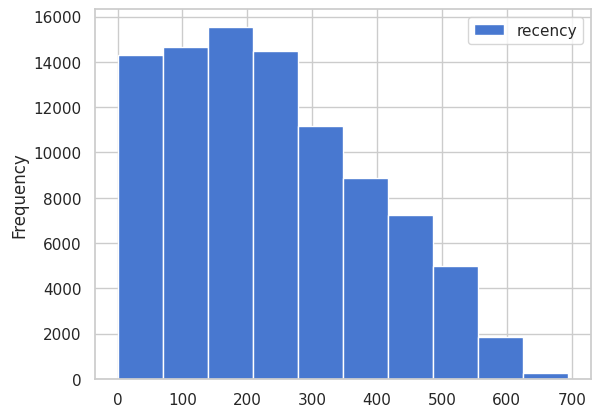

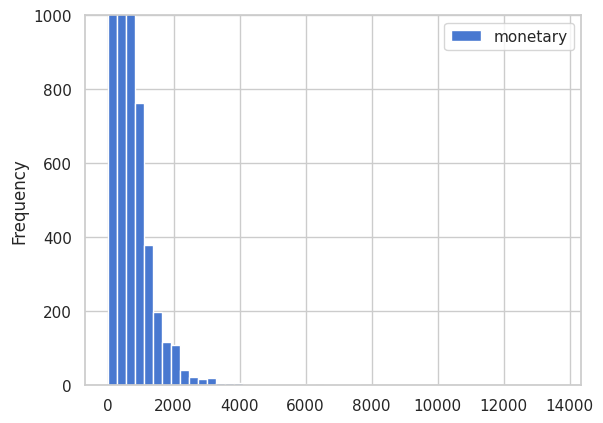

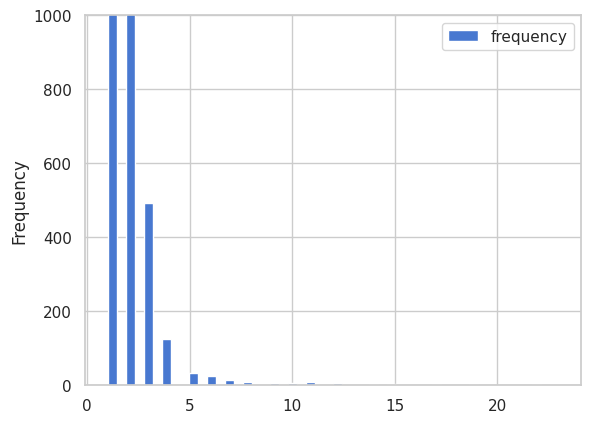

In [72]:
df_rfm.plot(y="recency", kind='hist')
df_rfm.plot(y="monetary", kind='hist', bins=50, ylim=(0,1000))
df_rfm.plot(y="frequency", kind='hist', bins=50, ylim=(0,1000))

In [73]:
df_rfm.describe()

,recency,frequency,monetary
count,93357.000000,93357.000000,93357.000000
mean,237.514434,1.072624,164.973612
std,152.589811,0.380352,226.124975
min,0.000000,1.000000,6.180000
25%,114.000000,1.000000,62.910000
50%,219.000000,1.000000,107.780000
75%,346.000000,1.000000,182.320000
max,695.000000,23.000000,13664.080000


In [74]:
from sklearn.cluster import KMeans

sse={}
df_recency = df_rfm[['recency']]
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(df_recency)
    df_recency["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_

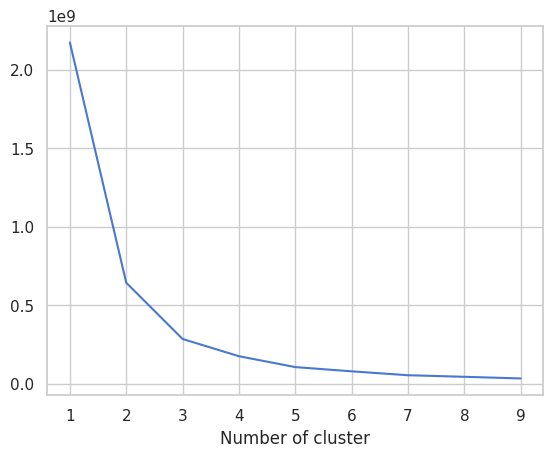

In [75]:
# Plot
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [76]:
# 3 clusters for recency
kmeans = KMeans(n_clusters=3)
kmeans.fit(df_recency)
df_rfm['RecencyCluster'] = kmeans.predict(df_recency)
df_rfm.head(7)

,recency,frequency,monetary,RecencyCluster
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,0
0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,0
0000f46a3911fa3c0805444483337064,537,1,86.22,2
0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,1
0004aac84e0df4da2b147fca70cf8255,288,1,196.89,1
0004bd2a26a76fe21f786e4fbd80607f,146,1,166.98,0
00050ab1314c0e55a6ca13cf7181fecf,131,1,35.38,0


In [77]:
df_rfm.RecencyCluster.value_counts()

,count
RecencyCluster,
0,36208
1,35260
2,21889


In [78]:
df_rfm.groupby('RecencyCluster').agg({'recency':[np.mean, len]})

recency       
                      mean    len
RecencyCluster                   
0                87.292007  36208
1               255.173625  35260
2               457.560601  21889

In [79]:
# Re-ordering cluster numbers
def fix_cluster_order(cluster_number_field, cluster_field, df, ascending):
    df_new             = df.groupby(cluster_number_field)[cluster_field].mean().reset_index()
    df_new             = df_new.sort_values(by=cluster_field, ascending=ascending).reset_index(drop=True)
    df_new['index']    = df_new.index
    df_final           = pd.merge(df, df_new[[cluster_number_field,'index']], on=cluster_number_field)
    df_final           = df_final.drop([cluster_number_field],axis=1)
    df_final           = df_final.rename(columns={"index":cluster_number_field})
    return df_final

In [80]:
df_rfm = fix_cluster_order('RecencyCluster', 'recency', df_rfm, False)

In [81]:
df_rfm.groupby('RecencyCluster').agg({'recency':[np.mean, len]})

recency       
                      mean    len
RecencyCluster                   
0               457.560601  21889
1               255.173625  35260
2                87.292007  36208

<Axes: xlabel='recency', ylabel='monetary'>

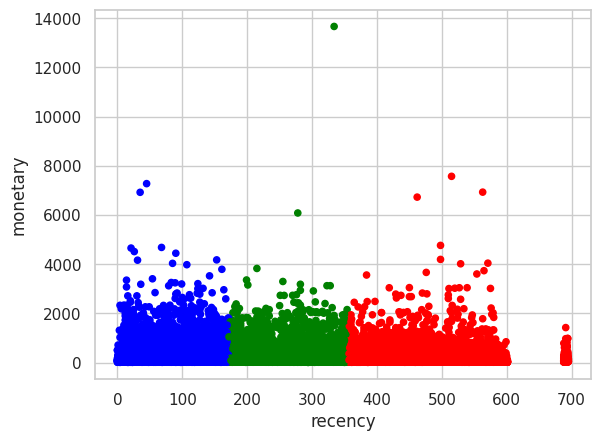

In [82]:
df_rfm.plot(x='recency', y='monetary', kind='scatter', color=df_rfm.RecencyCluster.map({0:'red', 1:'green', 2:'blue'}))

In [83]:
from sklearn.cluster import KMeans

sse={}
df_frequency = df_rfm[['frequency']]
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(df_frequency)
    df_frequency["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_

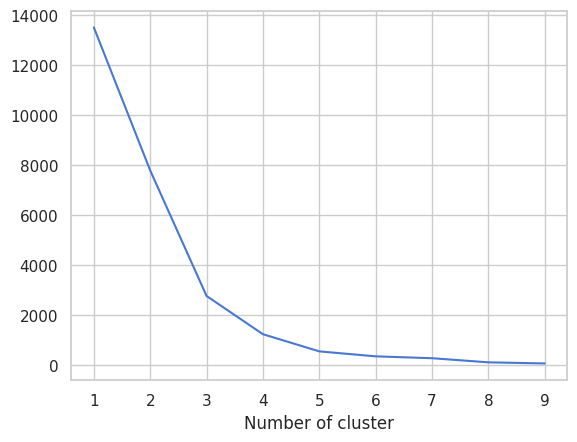

In [84]:
# Plot
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [85]:
df_frequency.head()

,frequency,clusters
0,1,0
1,1,0
2,1,0
3,1,0
4,1,0


In [86]:
# 3 clusters
kmeans = KMeans(n_clusters=3)
kmeans.fit(df_rfm[['frequency']])
df_rfm['FrequencyCluster'] = kmeans.predict(df_rfm[['frequency']])
df_rfm.head(7)

,recency,frequency,monetary,RecencyCluster,FrequencyCluster
0,111,1,141.90,2,0
1,114,1,27.19,2,0
2,537,1,86.22,0,0
3,321,1,43.62,1,0
4,288,1,196.89,1,0
5,146,1,166.98,2,0
6,131,1,35.38,2,0


In [87]:
df_rfm.FrequencyCluster.value_counts()

,count
FrequencyCluster,
0,87934
1,5373
2,50


In [88]:
df_rfm.groupby('FrequencyCluster').agg({'frequency':[np.mean, len]})

frequency       
                       mean    len
FrequencyCluster                  
0                  1.000000  87934
1                  2.175321   5373
2                 10.300000     50

In [89]:
df_rfm = fix_cluster_order('FrequencyCluster', 'frequency', df_rfm, True)

In [90]:
df_rfm.groupby('FrequencyCluster').agg({'frequency':[np.mean, len]})

frequency       
                       mean    len
FrequencyCluster                  
0                  1.000000  87934
1                  2.175321   5373
2                 10.300000     50

<Axes: xlabel='frequency', ylabel='monetary'>

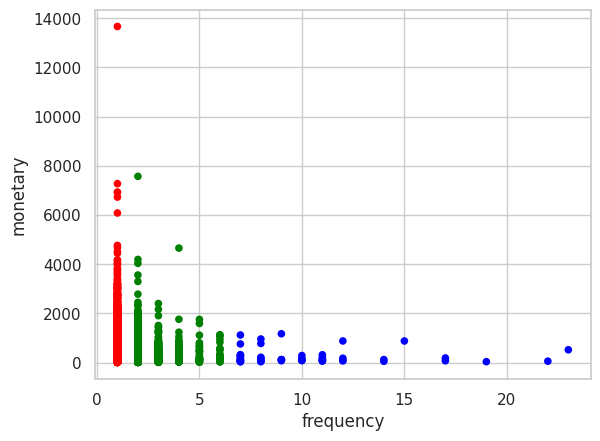

In [91]:
df_rfm.plot(x='frequency', y='monetary', kind='scatter', color=df_rfm.FrequencyCluster.map({0:'red', 1:'green', 2:'blue', 3:'orange'}))

In [92]:
df_rfm.head()

,recency,frequency,monetary,RecencyCluster,FrequencyCluster
0,111,1,141.90,2,0
1,114,1,27.19,2,0
2,537,1,86.22,0,0
3,321,1,43.62,1,0
4,288,1,196.89,1,0


In [93]:
# Summarize
df_rfm.groupby('FrequencyCluster')[['frequency', 'monetary']].describe()

frequency                                                 monetary                                                                     
                     count       mean       std  min  25%  50%   75%   max    count        mean         std    min      25%      50%       75%       max
FrequencyCluster                                                                                                                                        
0                  87934.0   1.000000  0.000000  1.0  1.0  1.0   1.0   1.0  87934.0  160.563598  220.470202  10.07  62.0600  105.625  176.8700  13664.08
1                   5373.0   2.175321  0.532777  2.0  2.0  2.0   2.0   6.0   5373.0  236.333968  294.376764   6.18  86.1800  157.950  277.2000   7571.63
2                     50.0  10.300000  3.850523  7.0  7.0  9.0  11.0  23.0     50.0  252.393800  298.936832  34.00  77.0975  128.210  259.6975   1172.66

In [94]:
from sklearn.cluster import KMeans

sse={}
df_monetary = df_rfm[['monetary']]
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(df_monetary)
    df_monetary["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_

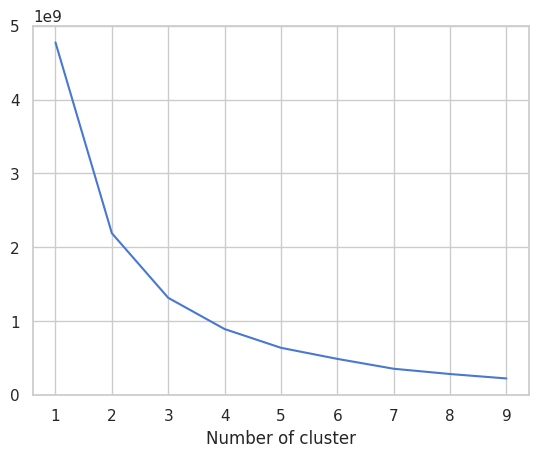

In [95]:
# Plot
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [96]:
# 3 clusters
kmeans = KMeans(n_clusters=3)
kmeans.fit(df_rfm[['monetary']])
df_rfm['MonetaryCluster'] = kmeans.predict(df_rfm[['monetary']])
df_rfm.head(7)

,recency,frequency,monetary,RecencyCluster,FrequencyCluster,MonetaryCluster
0,111,1,141.90,2,0,0
1,114,1,27.19,2,0,0
2,537,1,86.22,0,0,0
3,321,1,43.62,1,0,0
4,288,1,196.89,1,0,0
5,146,1,166.98,2,0,0
6,131,1,35.38,2,0,0


In [97]:
df_rfm.MonetaryCluster.value_counts()

,count
MonetaryCluster,
0,83107
2,9329
1,921


In [98]:
df_rfm.groupby('MonetaryCluster').agg({'monetary':[np.mean, len]})

monetary       
                        mean    len
MonetaryCluster                    
0                 111.004442  83107
1                1715.598545    921
2                 492.671146   9329

<Axes: xlabel='frequency', ylabel='monetary'>

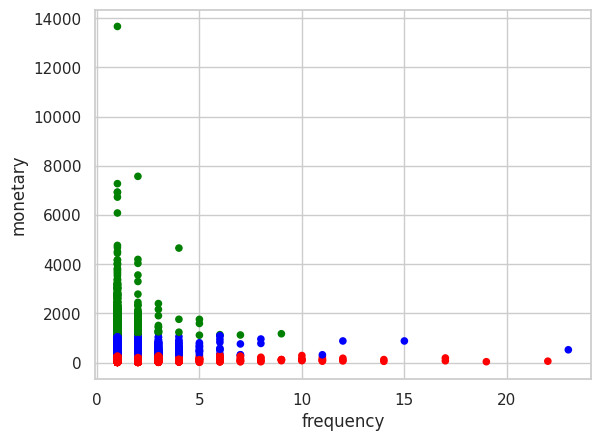

In [99]:
df_rfm.plot(x='frequency', y='monetary', kind='scatter', color=df_rfm.MonetaryCluster.map({0:'red', 1:'green', 2:'blue', 3:'orange'}))

In [100]:
df_rfm.head()

,recency,frequency,monetary,RecencyCluster,FrequencyCluster,MonetaryCluster
0,111,1,141.90,2,0,0
1,114,1,27.19,2,0,0
2,537,1,86.22,0,0,0
3,321,1,43.62,1,0,0
4,288,1,196.89,1,0,0


In [101]:
# Approach 1: Sum
df_rfm['SegmentScore'] = df_rfm[['RecencyCluster', 'FrequencyCluster', 'MonetaryCluster']].apply(np.sum, axis=1)

# Approach 2: Product
df_rfm['SegmentScore2'] = (df_rfm['RecencyCluster']+1) * (df_rfm['FrequencyCluster']+1) * (df_rfm['MonetaryCluster']+1)

df_rfm.head()

,recency,frequency,monetary,RecencyCluster,FrequencyCluster,MonetaryCluster,SegmentScore,SegmentScore2
0,111,1,141.90,2,0,0,2,3
1,114,1,27.19,2,0,0,2,3
2,537,1,86.22,0,0,0,0,1
3,321,1,43.62,1,0,0,1,2
4,288,1,196.89,1,0,0,1,2


In [102]:
# Approach 1
print(df_rfm.groupby('SegmentScore').agg({'recency':[len, np.mean], 'frequency':np.mean, 'monetary':np.mean}))

# Approach 2
print(df_rfm.groupby('SegmentScore2').agg({'recency':[len, np.mean], 'frequency':np.mean, 'monetary':np.mean}))

             recency             frequency    monetary
                 len        mean      mean        mean
SegmentScore                                          
0              18438  457.163250  1.000000  107.822451
1              31106  262.952485  1.040539  121.392950
2              34438  117.739793  1.059382  145.886405
3               5239  204.996564  1.410956  480.084066
4               3655  107.986867  1.175923  507.226389
5                477   86.972746  2.352201  506.344004
6                  4   45.250000  9.250000  681.770000
              recency             frequency     monetary
                  len        mean      mean         mean
SegmentScore2                                           
1               18438  457.163250  1.000000   107.822451
2               31106  262.952485  1.040539   121.392950
3               32571  109.707777  1.006018   133.791743
4                1867  257.863417  1.990359   356.885469
6                5194  204.502310  1.403543   471.2

In [103]:
# Approach 1
df_rfm['Segment'] = df_rfm['SegmentScore'].map({0:"Low", 1:"Low", 2:"Mid", 3:"Mid", 4:"High", 5:"High", 6:"High"})

# Approach 2
df_rfm['Segment2'] = 'Low'
df_rfm.loc[df_rfm['SegmentScore2']>2,'Segment2'] = 'Mid'
df_rfm.loc[df_rfm['SegmentScore2']>9,'Segment2'] = 'High'

In [104]:
df_rfm.groupby('Segment').agg({'recency':[len, np.mean], 'frequency':np.mean, 'monetary':np.mean})

recency             frequency    monetary
            len        mean      mean        mean
Segment                                          
High       4136  105.502660  1.319391  507.293428
Low       49544  335.228807  1.025452  116.342634
Mid       39677  129.261285  1.105804  190.014277

In [105]:
df_rfm.groupby('Segment2').agg({'recency':[len, np.mean], 'frequency':np.mean, 'monetary':np.mean})

recency             frequency    monetary
             len        mean      mean        mean
Segment2                                          
High         935  160.754011  2.315508  547.786684
Low        49544  335.228807  1.025452  116.342634
Mid        42878  126.282802  1.100028  212.817331

In [106]:
df_rfm.head()

,recency,frequency,monetary,RecencyCluster,FrequencyCluster,MonetaryCluster,SegmentScore,SegmentScore2,Segment,Segment2
0,111,1,141.90,2,0,0,2,3,Mid,Mid
1,114,1,27.19,2,0,0,2,3,Mid,Mid
2,537,1,86.22,0,0,0,0,1,Low,Low
3,321,1,43.62,1,0,0,1,2,Low,Low
4,288,1,196.89,1,0,0,1,2,Low,Low


In [107]:
from matplotlib import colors
np.random.seed(101)

In [108]:
# color_sel = [color_list[i] for i in df_rfm.SegmentScore ]

<Axes: xlabel='frequency', ylabel='monetary'>

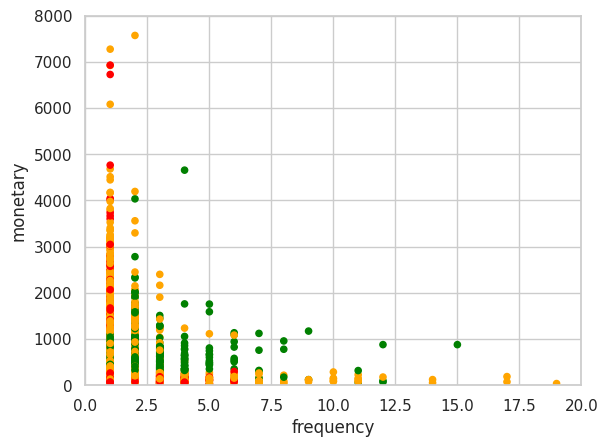

In [109]:
df_rfm.plot(x='frequency', y='monetary', kind='scatter',
            color=df_rfm.Segment.map({'Low':'red', 'Mid':'orange', 'High':'green'}),
            ylim=[0,8000],
            xlim=[0,20])

<Axes: xlabel='frequency', ylabel='monetary'>

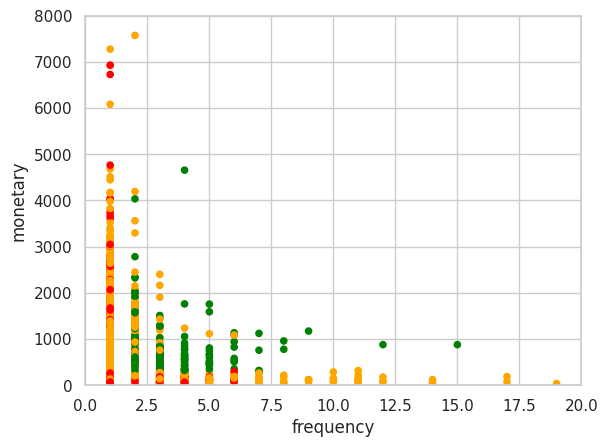

In [110]:
df_rfm.plot(x='frequency', y='monetary', kind='scatter',
            color=df_rfm.Segment2.map({'Low':'red', 'Mid':'orange', 'High':'green'}),
            ylim=[0,8000],
            xlim=[0,20])

<Axes: xlabel='frequency', ylabel='monetary'>

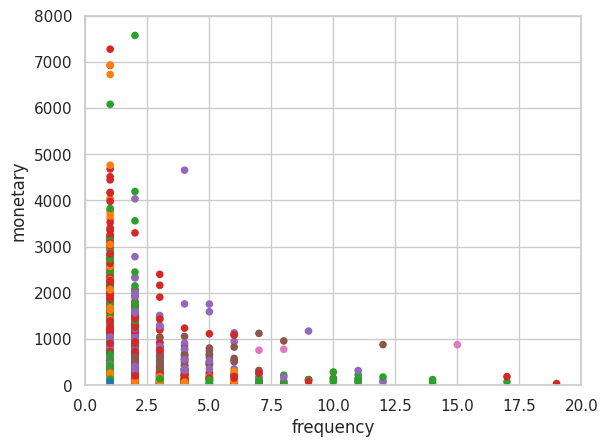

In [111]:
# Color by segment score using tableau colors
color_segscore = [list(colors.TABLEAU_COLORS.keys())[i] for i in df_rfm.SegmentScore ]
df_rfm.plot(x='frequency', y='monetary', kind='scatter',
            color=color_segscore,
            ylim=[0,8000],
            xlim=[0,20])

<Axes: xlabel='recency', ylabel='monetary'>

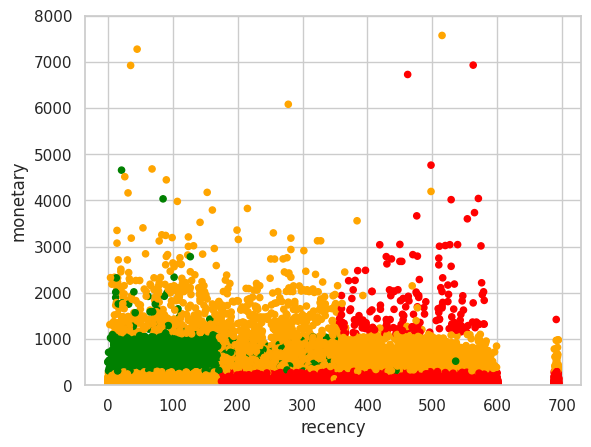

In [112]:
df_rfm.plot(x='recency', y='monetary', kind='scatter', color=df_rfm.Segment.map({'Low':'red', 'Mid':'orange', 'High':'green'}), ylim=[0,8000])

<Axes: xlabel='recency', ylabel='monetary'>

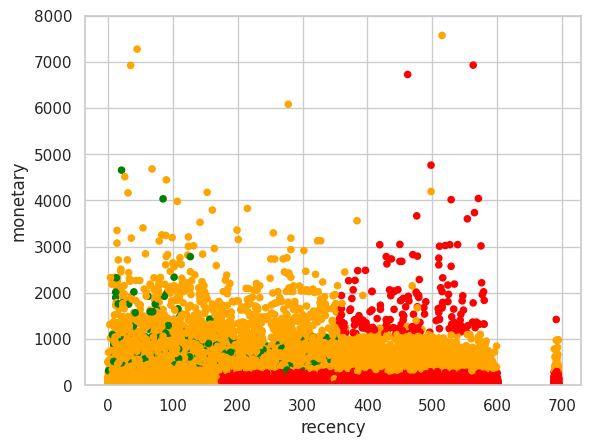

In [113]:
df_rfm.plot(x='recency', y='monetary', kind='scatter', color=df_rfm.Segment2.map({'Low':'red', 'Mid':'orange', 'High':'green'}), ylim=[0,8000])

<Axes: xlabel='recency', ylabel='frequency'>

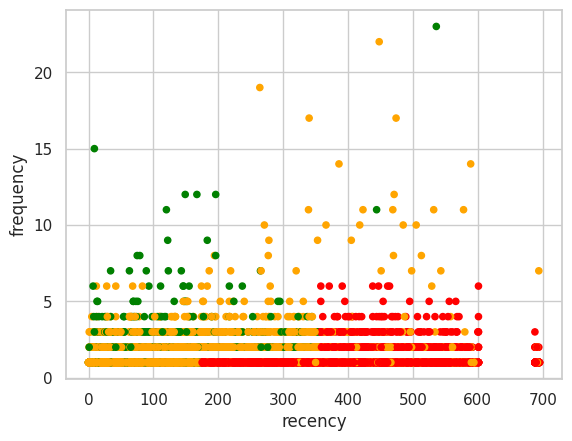

In [114]:
df_rfm.plot(x='recency', y='frequency', kind='scatter', color=df_rfm.Segment.map({'Low':'red', 'Mid':'orange', 'High':'green'}))

In [115]:
df_full = pd.read_csv('df_full.csv', index_col=False)

In [116]:
df_full.head(25)

,order_id,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_date,delivery_against_estimated,order_purchase_year,order_purchase_month,order_purchase_dayofweek,order_purchase_hour,order_purchase_day,order_purchase_mon,month_year,month_y
0,b81ef226f3fe1789b1e8b2acac839d17,1,Credit Card,8,99.33,1,af74cc53dcffc8384b29e7abfa41902b,213b25e6f54661939f11710a6fddb871,2018-05-02 22:15:09,79.80,19.53,0a8556ac6be836b46b3e89920d59291c,delivered,2018-04-25 22:01:49,2018-04-25 22:15:09,2018-05-02 15:20:00,2018-05-09 17:36:51,2018-05-22,708ab75d2a007f0564aedd11139c7708,39801,Teofilo Otoni,MG,2018-04-25 22:01:49,12.0,2018,4,2,22,Wed,Apr,2018-04,201804
1,a9810da82917af2d9aefd1278f1dcfa0,1,Credit Card,1,24.39,1,a630cc320a8c872f9de830cf121661a3,eaf6d55068dea77334e8477d3878d89e,2018-07-02 11:18:58,17.00,7.39,f2c7fc58a9de810828715166c672f10a,delivered,2018-06-26 11:01:38,2018-06-26 11:18:58,2018-06-28 14:18:00,2018-06-29 20:32:09,2018-07-16,a8b9d3a27068454b1c98cc67d4e31e6f,2422,Sao Paulo,SP,2018-06-26 11:01:38,16.0,2018,6,1,11,Tue,Jun,2018-06,201806
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,Credit Card,1,65.71,1,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,2017-12-26 09:52:34,56.99,8.72,25b14b69de0b6e184ae6fe2755e478f9,delivered,2017-12-12 11:19:55,2017-12-14 09:52:34,2017-12-15 20:13:22,2017-12-18 17:24:41,2018-01-04,6f70c0b2f7552832ba46eb57b1c5651e,2652,Sao Paulo,SP,2017-12-12 11:19:55,16.0,2017,12,1,11,Tue,Dec,2017-12,201712
3,ba78997921bbcdc1373bb41e913ab953,1,Credit Card,8,107.78,1,548e5bfe28edceab6b51fa707cc9556f,da8622b14eb17ae2831f4ac5b9dab84a,2017-12-12 12:13:20,89.90,17.88,7a5d8efaaa1081f800628c30d2b0728f,delivered,2017-12-06 12:04:06,2017-12-06 12:13:20,2017-12-07 20:28:28,2017-12-21 01:35:51,2018-01-04,87695ed086ebd36f20404c82d20fca87,36060,Juiz De Fora,MG,2017-12-06 12:04:06,13.0,2017,12,2,12,Wed,Dec,2017-12,201712
4,42fdf880ba16b47b59251dd489d4441a,1,Credit Card,2,128.45,1,386486367c1f9d4f587a8864ccb6902b,cca3071e3e9bb7d12640c9fbe2301306,2018-05-31 16:14:41,113.57,14.88,15fd6fb8f8312dbb4674e4518d6fa3b3,delivered,2018-05-21 13:59:17,2018-05-21 16:14:41,2018-05-22 11:46:00,2018-06-01 21:44:53,2018-06-13,4291db0da71914754618cd789aebcd56,18570,Conchas,SP,2018-05-21 13:59:17,11.0,2018,5,0,13,Mon,May,2018-05,201805
5,298fcdf1f73eb413e4d26d01b25bc1cd,1,Credit Card,2,96.12,1,eff40981f3d4639fb50c5dd51ac00d7a,640e21a7d01df7614a3b4923e990d40c,2018-05-11 15:31:11,34.35,13.71,a24e6f72471e9dbafcb292bc318f4859,delivered,2018-05-07 13:20:41,2018-05-07 15:31:14,2018-05-10 13:35:00,2018-05-14 19:02:54,2018-05-23,6e3c218d5f0434ddc4af3d6a60767bbf,13614,Leme,SP,2018-05-07 13:20:41,8.0,2018,5,0,13,Mon,May,2018-05,201805
6,298fcdf1f73eb413e4d26d01b25bc1cd,1,Credit Card,2,96.12,2,eff40981f3d4639fb50c5dd51ac00d7a,640e21a7d01df7614a3b4923e990d40c,2018-05-11 15:31:11,34.35,13.71,a24e6f72471e9dbafcb292bc318f4859,delivered,2018-05-07 13:20:41,2018-05-07 15:31:14,2018-05-10 13:35:00,2018-05-14 19:02:54,2018-05-23,6e3c218d5f0434ddc4af3d6a60767bbf,13614,Leme,SP,2018-05-07 13:20:41,8.0,2018,5,0,13,Mon,May,2018-05,201805
7,771ee386b001f06208a7419e4fc1bbd7,1,Credit Card,1,81.16,1,42a2c92a0979a949ca4ea89ec5c7b934,813348c996469b40f2e028d5429d3495,2017-06-29 13:25:19,59.90,21.26,206c0fcc717333d169ff95933fb47341,delivered,2017-06-23 13:11:27,2017-06-23 13:25:19,2017-06-26 17:33:37,2017-07-03 15:59:46,2017-07-17,9a3526eee723accd014ec683afe5bf20,31230,Belo Horizonte,MG,2017-06-23 13:11:27,13.0,2017,6,4,13,Fri,Jun,2017-06,201706
8,3d7239c394a212faae122962df514ac7,1,Credit Card,3,51.84,1,92e16cf2fab490ab9ae87a305d5f8f7f,25debeafbce801fdd479539350185eee,2017-06-09 10:55:16,39.99,11.85,4d7a9b8bba459dce09d1b8fa637a0cba,delivered,2017-06-05 10:

In [117]:
# Df_Full is at item level. Bring it to order level for calc purpose
df_orderlevel = df_full.groupby(['customer_unique_id', 'order_id']).agg({
    'order_date': np.max,
    'payment_value':np.sum,
})

# make index as columns
df_orderlevel.reset_index(inplace=True)

# convert to datetime
df_orderlevel['order_date'] = pd.to_datetime(df_orderlevel['order_date'])

# view
df_orderlevel.head(7)

,customer_unique_id,order_id,order_date,payment_value
0,0000366f3b9a7992bf8c76cfdf3221e2,e22acc9c116caa3f2b7121bbb380d08e,2018-05-10 10:56:27,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,3594e05a005ac4d06a72673270ef9ec9,2018-05-07 11:11:27,27.19
2,0000f46a3911fa3c0805444483337064,b33ec3b699337181488304f362a6b734,2017-03-10 21:05:03,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,41272756ecddd9a9ed0180413cc22fb6,2017-10-12 20:29:41,43.62
4,0004aac84e0df4da2b147fca70cf8255,d957021f1127559cd947b62533f484f7,2017-11-14 19:45:42,196.89
5,0004bd2a26a76fe21f786e4fbd80607f,3e470077b690ea3e3d501cffb5e0c499,2018-04-05 19:33:16,166.98
6,00050ab1314c0e55a6ca13cf7181fecf,d0028facea13f508e880202d7097a5a1,2018-04-20 12:57:23,35.38


In [118]:
# 1. Bring it to customer level
# 2. Calculate lifespan and order frequency
df_custlevel = df_orderlevel.groupby('customer_unique_id').agg({
    'order_date': lambda date: (date.max() - date.min()).days,  # lifespan
    'order_id': lambda order: len(order),  # order freq
    'payment_value': lambda pay: np.sum(pay),  # customer value
})

df_custlevel.reset_index(inplace=True)
df_custlevel.rename(columns={'order_date': 'lifespan',
                             'order_id': 'frequency'},
                    inplace=True)

df_custlevel.head(7)

,customer_unique_id,lifespan,frequency,payment_value
0,0000366f3b9a7992bf8c76cfdf3221e2,0,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0,1,27.19
2,0000f46a3911fa3c0805444483337064,0,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,0,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,0,1,196.89
5,0004bd2a26a76fe21f786e4fbd80607f,0,1,166.98
6,00050ab1314c0e55a6ca13cf7181fecf,0,1,35.38


In [119]:
df_custlevel = df_custlevel.sort_values(by='frequency', ascending=False)
df_custlevel.head()

,customer_unique_id,lifespan,frequency,payment_value
51423,8d50f5eadf50201ccdcedfb9e2ac8455,427,15,879.27
22775,3e43e6105506432c953e165fb2acf44c,161,9,1963.58
10058,1b6c7548a2a1f9037c1fd3ddfed95f33,92,7,1386.54
36702,6469f99c1f9dfae7733b25662e7f1782,281,7,973.09
73908,ca77025e7201e3b30c44b472ff346268,234,7,2126.44


In [120]:
df_custlevel['frequency'].value_counts()

,count
frequency,
1,90541
2,2572
3,181
4,28
5,9
6,5
7,3
15,1
9,1


In [121]:
df_custlevel['avg_order_value'] = df_custlevel['payment_value']/df_custlevel['frequency']
df_custlevel.head(7)

,customer_unique_id,lifespan,frequency,payment_value,avg_order_value
51423,8d50f5eadf50201ccdcedfb9e2ac8455,427,15,879.27,58.618000
22775,3e43e6105506432c953e165fb2acf44c,161,9,1963.58,218.175556
10058,1b6c7548a2a1f9037c1fd3ddfed95f33,92,7,1386.54,198.077143
36702,6469f99c1f9dfae7733b25662e7f1782,281,7,973.09,139.012857
73908,ca77025e7201e3b30c44b472ff346268,234,7,2126.44,303.777143
87868,f0e310a6839dce9de1638e0fe5ab282a,320,6,540.69,90.115000
6964,12f5d6e1cbf93dafd9dcc19095df0b3d,0,6,110.72,18.453333


In [122]:
purchase_frequency = sum(df_custlevel['frequency'])/df_custlevel.shape[0]
purchase_frequency

1.0334151123300586

In [123]:
repeat_rate = (df_custlevel['frequency'] > 1).sum()/df_custlevel.shape[0]
churn_rate = 1 - repeat_rate

print(purchase_frequency, repeat_rate, churn_rate)

1.0334151123300586 0.029997535916692557 0.9700024640833075


In [124]:
df_custlevel['CLTV'] = ((df_custlevel['avg_order_value'] * purchase_frequency)/churn_rate)

In [125]:
df_custlevel.sample(10)

,customer_unique_id,lifespan,frequency,payment_value,avg_order_value,CLTV
39615,6c4f22a436757085432e2615eef0bbc8,0,1,81.26,81.26,86.572267
201,008778a1591d49f6b2464dffaa4fa662,0,1,260.55,260.55,277.583117
62149,aa3e4c63f6a40214fb38928da5b8e515,0,1,245.57,245.57,261.623819
859,02578a30eaf25ecf087a3728dc04b85a,0,1,54.09,54.09,57.626063
13137,23d83aae8643744884d8e64678220754,0,1,218.52,218.52,232.805461
75048,cd94dd7a37a6160bf004a86f9d36765d,0,1,702.08,702.08,747.977566
69640,beaaf6f125d53e5acc21c2e14fd878f2,0,1,55.24,55.24,58.851243
38368,68fff92320db6e5e17479bae49c95498,0,1,337.52,337.52,359.584931
19144,344f60e4ffb6c317ec1d6794d44ca0f9,0,1,79.98,79.98,85.208588
23089,3f1577ae405a1a1aad963e093b05ac6d,0,1,1006.72,1006.72,1072.533009


In [126]:
df_custlevel.CLTV.sum().round(2)

20345264.84

In [127]:
df.head()

,order_purchase_timestamp,customer_unique_id,payment_value
0,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.12
1,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,2.00
2,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.59
3,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46
4,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12


In [128]:
# Put in datetime format
df['order_purchase_timestamp'] = pd.to_datetime(df.order_purchase_timestamp)

In [129]:
df['month_yr'] = df['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y-%m'))
df.head()

,order_purchase_timestamp,customer_unique_id,payment_value,month_yr
0,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.12,2017-10
1,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,2.00,2017-10
2,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.59,2017-10
3,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46,2018-07
4,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12,2018-08


In [130]:
df['month_yr'] = df['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y-%m'))
df.head()

,order_purchase_timestamp,customer_unique_id,payment_value,month_yr
0,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.12,2017-10
1,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,2.00,2017-10
2,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,18.59,2017-10
3,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46,2018-07
4,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12,2018-08


In [131]:
np.sum(df.customer_unique_id.value_counts() > 1)/len(df.customer_unique_id)

0.054155806545033304

In [132]:
df_sales = df.pivot_table(index=['customer_unique_id'],columns=['month_yr'],values='payment_value', aggfunc='sum', fill_value=0).reset_index()

In [133]:
df_sales.head(20)

month_yr,customer_unique_id,2016-10,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08
0,0000366f3b9a7992bf8c76cfdf3221e2,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,141.90,0.00,0.0,0.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,27.19,0.00,0.0,0.0
2,0000f46a3911fa3c0805444483337064,0.0,0.0,0.0,0.0,86.22,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
3,0000f6ccb0745a6a4b88665a16c9f078,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,43.62,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
4,0004aac84e0df4da2b147fca70cf8255,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,196.89,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
5,0004bd2a26a76fe21f786e4fbd80607f,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,166.98,0.00,0.00,0.0,0.0
6,00050ab1314c0e55a6ca13cf7181fecf,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,35.38,0.00,0.00,0.0,0.0
7,00053a61a98854899e70ed204dd4bafe,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,419.18,0.00,0.00,0.00,0.00,0.0,0.0
8,0005e1862207bf6ccc02e4228effd9a0,0.0,0.0,0.0,0.0,150.12,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0
9,0005ef4cd20d2893f0d9fbd94d3c0d97,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,129.76,0.00,0.00,0.00,0.0,0.0


In [134]:
df_sales['CLV']=df_sales.iloc[:,2:].sum(axis=1)
df_sales.head()

month_yr,customer_unique_id,2016-10,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,CLV
0,0000366f3b9a7992bf8c76cfdf3221e2,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,141.90,0.0,0.0,0.0,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,27.19,0.0,0.0,0.0,27.19
2,0000f46a3911fa3c0805444483337064,0.0,0.0,0.0,0.0,86.22,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,43.62,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,43.62
4,0004aac84e0df4da2b147fca70cf8255,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,196.89,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,196.89


In [135]:
X = df_sales[['2018-08','2018-07', '2018-06','2018-05','2018-04','2018-03']]
y = df_sales[['CLV']]

In [136]:
# split training set and test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [137]:
# import model
from sklearn.linear_model import LinearRegression

# instantiate
linreg = LinearRegression()

# fit the model to the training data (learn the coefficients)
linreg.fit(X_train, y_train)

# make predictions on the testing set
y_pred = linreg.predict(X_test)

In [138]:
# print the intercept and coefficients
print(linreg.intercept_)
print(linreg.coef_)

[111.34399466]
[[0.76377533 0.789606   0.77480437 0.7885248  0.77029104 0.71875057]]


In [139]:
# Compute R-Squared
from sklearn import metrics
print("R-Square:", metrics.r2_score(y_test, y_pred))

R-Square: 0.32580780073430615


In [140]:
# customers with at least 2 transactions
elig_customers = df.customer_unique_id.value_counts().index[df.customer_unique_id.value_counts() > 1]
df_app1 = df.loc[df.customer_unique_id.isin(elig_customers), :]

In [141]:
df_app1.shape

(12203, 4)

In [142]:
# Approach 1
df_sales = df_app1.pivot_table(index=['customer_unique_id'],columns=['month_yr'],values='payment_value', aggfunc='sum', fill_value=0).reset_index()
df_sales['CLV'] = df_sales.iloc[:,2:].sum(axis=1)
df_sales.head()

month_yr,customer_unique_id,2016-10,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,CLV
0,000e309254ab1fc5ba99dd469d36bdb4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,78.42,0.0,0.0,78.42
1,0028a7d8db7b0247652509358ad8d755,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,354.87,0.00,0.0,0.00,0.0,0.0,0.00,0.0,0.0,354.87
2,00324c9f4d710e7bac5c5ba679714430,0.0,0.0,0.0,0.0,0.0,0.0,0.0,109.78,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.0,0.0,109.78
3,004288347e5e88a27ded2bb23747066c,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,251.09,0.0,0.0,0.0,0.0,0.00,103.28,0.0,0.00,0.0,0.0,0.00,0.0,0.0,354.37
4,0058f300f57d7b93c477a131a59b36c3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.0,96.02,0.0,0.0,0.00,0.0,0.0,96.02


In [143]:
X = df_sales[['2018-08','2018-07', '2018-06','2018-05','2018-04','2018-03']]
y = df_sales[['CLV']]


In [144]:
# split training set and test set
from sklearn.model_selection import train_test_split
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, random_state=0)

# import model
from sklearn.linear_model import LinearRegression

# instantiate
linreg = LinearRegression()

# fit the model to the training data (learn the coefficients)
linreg.fit(X_train2, y_train2)

# make predictions on the testing set
y_pred2 = linreg.predict(X_test2)

# print the intercept and coefficients
print(linreg.intercept_)
print(linreg.coef_)

# Compute R-Squared
from sklearn import metrics
print("R-Square:",metrics.r2_score(y_test2, y_pred2))

[175.46957211]
[[0.85186484 0.73634488 0.78124035 0.75630072 0.73772576 0.68077824]]
R-Square: 0.22311422956505333


In [145]:
X = df_sales[['2018-08', '2018-07', '2018-06', '2018-05', '2018-04', '2018-03',
              '2018-02', '2018-01', '2017-12', '2017-11', '2017-10', '2017-09']]

y = df_sales[['CLV']]

In [146]:
# split training set and test set
from sklearn.model_selection import train_test_split
X_train3, X_test3, y_train3, y_test3 = train_test_split(X, y, random_state=0)

# import model
from sklearn.linear_model import LinearRegression

# instantiate
linreg = LinearRegression()

# fit the model to the training data (learn the coefficients)
linreg.fit(X_train3, y_train3)

# make predictions on the testing set
y_pred3 = linreg.predict(X_test3)

# print the intercept and coefficients
print(linreg.intercept_)
print(linreg.coef_)

# Compute R-Squared
from sklearn import metrics
print("R-Square:",metrics.r2_score(y_test3, y_pred3))

[85.58011594]
[[0.92921604 0.87450579 0.88361834 0.87309606 0.83737053 0.82110116
  0.85987345 0.87613918 0.85570371 0.86577022 0.92098443 0.9308609 ]]
R-Square: 0.4180680746320975


In [147]:
pd.DataFrame(y_pred).describe()

,0
count,23340.000000
mean,163.961832
std,134.124797
min,111.343995
25%,111.343995
50%,111.343995
75%,178.134508
max,5577.162552


In [148]:
# customers with at least 2 transactions
elig_customers = df.customer_unique_id.value_counts().index[df.customer_unique_id.value_counts() >= 5]
df_app2 = df.loc[df.customer_unique_id.isin(elig_customers), :]
df_app2.shape

(830, 4)

In [149]:
# Approach 2
df_sales = df_app2.pivot_table(index=['customer_unique_id'],
                               columns=['month_yr'],
                               values='payment_value',
                               aggfunc='sum',
                               fill_value=0).reset_index()
df_sales['CLV'] = df_sales.iloc[:,2:].sum(axis=1)
df_sales.head()

month_yr,customer_unique_id,2016-10,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,CLV
0,00face5c8f7dbb7eefd4112722f26903,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,28.19,0.0,0.00,0.0,0.0,0.0,28.19
1,024676cef113f6c81db6c5b8d29e5ee9,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,60.41,0.0,0.0,0.0,60.41
2,08d8fd00898e7cc99d6e32c74d7d3ce5,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35.0,0.00,0.0,0.00,0.0,0.0,0.0,35.00
3,096e351116755fe4c3c1e48eaf301a41,0.0,0.0,0.0,0.0,0.0,217.49,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,217.49
4,09f55ef15bde8baeef87b3348b31c150,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,43.1,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,43.10


In [150]:
X = df_sales[['2018-08', '2018-07', '2018-06', '2018-05', '2018-04', '2018-03',
              '2018-02', '2018-01', '2017-12', '2017-11', '2017-10', '2017-09']]

y = df_sales[['CLV']]

In [151]:
# split training set and test set
from sklearn.model_selection import train_test_split
X_train4, X_test4, y_train4, y_test4 = train_test_split(X, y, random_state=0)

# import model
from sklearn.linear_model import LinearRegression

# instantiate
linreg = LinearRegression()

# fit the model to the training data (learn the coefficients)
linreg.fit(X_train4, y_train4)

# make predictions on the testing set
y_pred4 = linreg.predict(X_test4)

# print the intercept and coefficients
print(linreg.intercept_)
print(linreg.coef_)

# Compute R-Squared
from sklearn import metrics
print("R-Square:",metrics.r2_score(y_test4, y_pred4))

[105.46805379]
[[1.48430238 0.73859531 0.95955687 1.25035994 0.91961742 0.98489107
  0.97492126 0.37101888 0.80335822 1.17878815 0.81532839 1.34443922]]
R-Square: 0.7805693859232077


In [152]:
y_pred43 = linreg.predict(X_test3)

# print the intercept and coefficients
print(linreg.intercept_)
print(linreg.coef_)

# Compute R-Squared
from sklearn import metrics
print("R-Square:",metrics.r2_score(y_test3, y_pred43))

[105.46805379]
[[1.48430238 0.73859531 0.95955687 1.25035994 0.91961742 0.98489107
  0.97492126 0.37101888 0.80335822 1.17878815 0.81532839 1.34443922]]
R-Square: 0.3539240435142268


In [153]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'], format="%Y-%m-%d %H:%M:%S")
df['order_purchase_timestamp'] = df.order_purchase_timestamp.dt.date
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])
df['order_purchase_timestamp'].describe()

,order_purchase_timestamp
count,100137
mean,2017-12-31 02:07:07.310584576
min,2016-10-03 00:00:00
25%,2017-09-12 00:00:00
50%,2018-01-19 00:00:00
75%,2018-05-04 00:00:00
max,2018-08-29 00:00:00


In [154]:
# The last purchase made in the dataset was on August 29, 2018, so we will use that date as our current
# date to simulate an immediate study of the company's transactions.

date_today = df['order_purchase_timestamp'].max()
date_today

Timestamp('2018-08-29 00:00:00')

In [155]:
r = df.groupby('customer_unique_id').agg(['min', 'max'])['order_purchase_timestamp']
r['recency'] = r['max'] - r['min']
r

,min,max,recency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10,2018-05-10,0 days
0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07,2018-05-07,0 days
0000f46a3911fa3c0805444483337064,2017-03-10,2017-03-10,0 days
0000f6ccb0745a6a4b88665a16c9f078,2017-10-12,2017-10-12,0 days
0004aac84e0df4da2b147fca70cf8255,2017-11-14,2017-11-14,0 days
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,2017-06-08,2017-06-08,0 days
fffea47cd6d3cc0a88bd621562a9d061,2017-12-10,2017-12-10,0 days
ffff371b4d645b6ecea244b27531430a,2017-02-07,2017-02-07,0 days


In [156]:
r['T'] = date_today - r['min']
r = r[['recency', 'T']]

# Let's take a look at our new variables
r

,recency,T
customer_unique_id,,
0000366f3b9a7992bf8c76cfdf3221e2,0 days,111 days
0000b849f77a49e4a4ce2b2a4ca5be3f,0 days,114 days
0000f46a3911fa3c0805444483337064,0 days,537 days
0000f6ccb0745a6a4b88665a16c9f078,0 days,321 days
0004aac84e0df4da2b147fca70cf8255,0 days,288 days
...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,0 days,447 days
fffea47cd6d3cc0a88bd621562a9d061,0 days,262 days
ffff371b4d645b6ecea244b27531430a,0 days,568 days


In [157]:
aggregations = {
    'order_purchase_timestamp':'count',
    'payment_value': 'sum'}

f = df.groupby('customer_unique_id').agg(aggregations)

f['frequency'] = f['order_purchase_timestamp'] - 1  # per lifetimes definition

f = f[['frequency']]

In [158]:
# Let's create our final table joining both
rf = pd.merge(r,f, left_index=True, right_index=True)
rf

,recency,T,frequency
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,0 days,111 days,0
0000b849f77a49e4a4ce2b2a4ca5be3f,0 days,114 days,0
0000f46a3911fa3c0805444483337064,0 days,537 days,0
0000f6ccb0745a6a4b88665a16c9f078,0 days,321 days,0
0004aac84e0df4da2b147fca70cf8255,0 days,288 days,0
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,0 days,447 days,0
fffea47cd6d3cc0a88bd621562a9d061,0 days,262 days,0
ffff371b4d645b6ecea244b27531430a,0 days,568 days,0


In [159]:
from lifetimes.utils import summary_data_from_transaction_data

rfm = summary_data_from_transaction_data(df, customer_id_col='customer_unique_id', datetime_col='order_purchase_timestamp',
                                    monetary_value_col ='payment_value', observation_period_end='2018-08-29',
                                    datetime_format='%Y-%m-%d', freq='D')
rfm

,frequency,recency,T,monetary_value
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.0,0.0,111.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,0.0,114.0,0.0
0000f46a3911fa3c0805444483337064,0.0,0.0,537.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,0.0,0.0,321.0,0.0
0004aac84e0df4da2b147fca70cf8255,0.0,0.0,288.0,0.0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,0.0,0.0,447.0,0.0
fffea47cd6d3cc0a88bd621562a9d061,0.0,0.0,262.0,0.0
ffff371b4d645b6ecea244b27531430a,0.0,0.0,568.0,0.0


In [160]:
# Frequency
fig = px.histogram(rfm,
                   x=rfm['frequency'],
                   title='Frequency of purchase',
                   labels={'frequency':'Frequency'},
                   opacity=0.8, marginal='violin',
                   color_discrete_sequence=['indianred'])

py.iplot(fig)

In [161]:
# Recency
px.histogram(rfm, x=rfm['recency'],title='Recency of purchase',
                   labels={'recency':'Recency'}, nbins=50,
                   opacity=0.8, marginal='violin',
                   color_discrete_sequence=['indianred'])

In [162]:
px.histogram(rfm, x=rfm['T'],title='Time from first purchase',
                   labels={'T':'Weeks'},
                   opacity=0.8, marginal='violin',
                   color_discrete_sequence=['indianred'])

In [163]:
from lifetimes import BetaGeoFitter

# penalizer_coef is a parameter that penalizes the likelihood, usually values like 0.001 or
# 0.01 with small samples to prevent parameters from becoming too large

bgf = BetaGeoFitter(penalizer_coef=0.001)
bgf.fit(rfm['frequency'], rfm['recency'], rfm['T'], verbose=True)
print(bgf)

Optimization terminated successfully.
         Current function value: 0.082123
         Iterations: 45
         Function evaluations: 46
         Gradient evaluations: 46
<lifetimes.BetaGeoFitter: fitted with 93357 subjects, a: 0.35, alpha: 74.11, b: 0.06, r: 0.02>


In [164]:
bgf.summary

,coef,se(coef),lower 95% bound,upper 95% bound
r,0.016700,0.000943,0.014851,0.018548
alpha,74.110214,7.335495,59.732643,88.487784
a,0.351189,0.049377,0.254411,0.447968
b,0.061593,0.010105,0.041788,0.081399


<Axes: title={'center': 'Expected Number of Future Purchases for 4 Units of Time,\nby Frequency and Recency of a Customer'}, xlabel="Customer's Historical Frequency", ylabel="Customer's Recency">

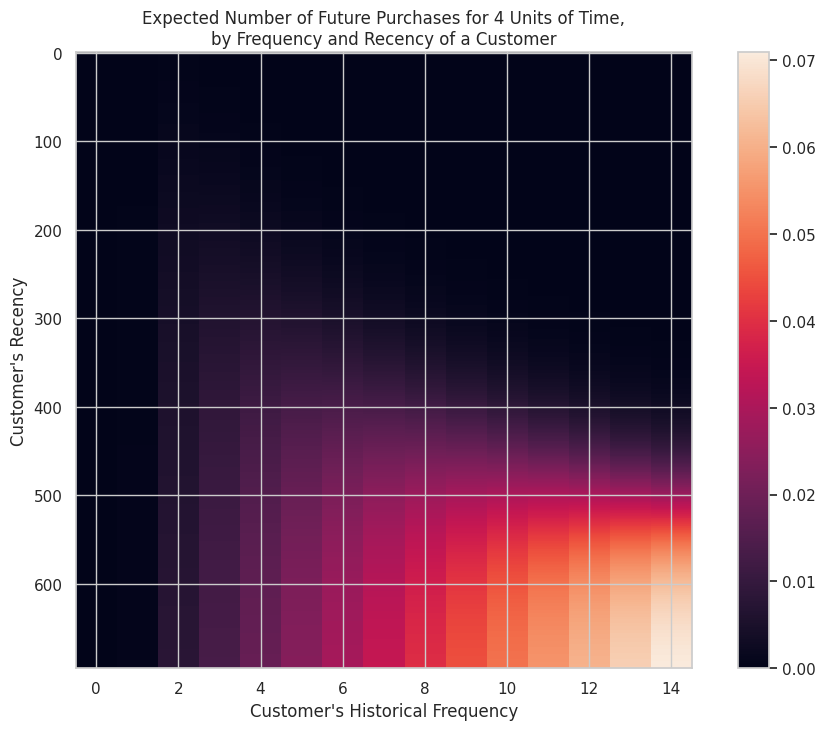

In [165]:
from lifetimes.plotting import plot_frequency_recency_matrix

# T = Unit times(weeks)
fig = plt.figure(figsize=(12,8))
plot_frequency_recency_matrix(bgf, T=4)

<Axes: title={'center': 'Probability Customer is Alive,\nby Frequency and Recency of a Customer'}, xlabel="Customer's Historical Frequency", ylabel="Customer's Recency">

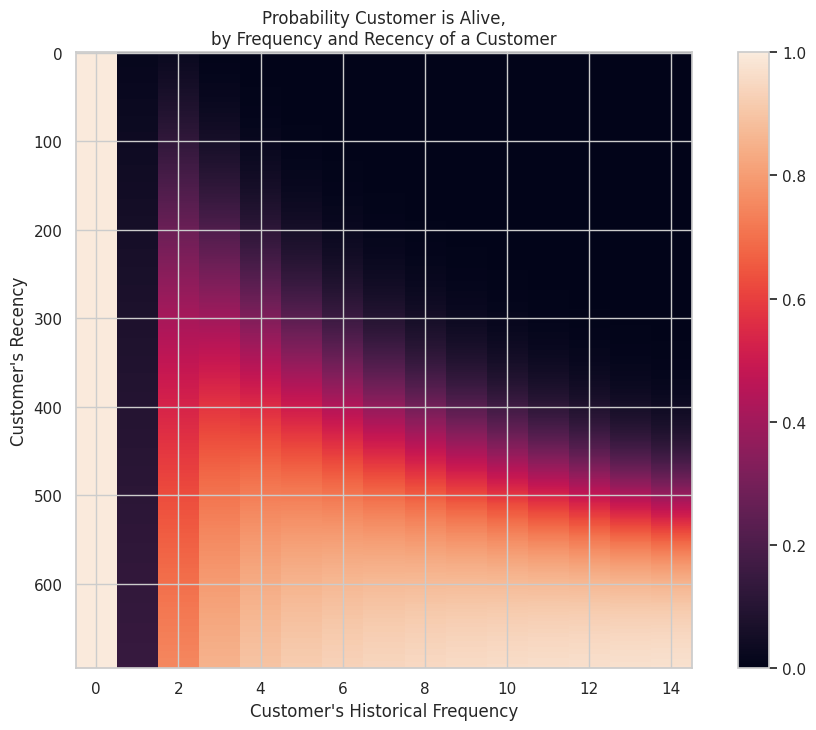

In [166]:
from lifetimes.plotting import plot_probability_alive_matrix

fig = plt.figure(figsize=(12,8))
plot_probability_alive_matrix(bgf)

In [167]:
t = 4 # Days for a future transaction
rfm['expected_4week'] = round(bgf.conditional_expected_number_of_purchases_up_to_time(t, rfm['frequency'], rfm['recency'], rfm['T']), 2)
rfm.sort_values(by='expected_4week', ascending=False)

,frequency,recency,T,monetary_value,expected_4week
customer_unique_id,,,,,
8d50f5eadf50201ccdcedfb9e2ac8455,14.0,428.0,437.0,59.108571,0.11
ca77025e7201e3b30c44b472ff346268,6.0,235.0,324.0,138.941667,0.05
dc813062e0fc23409cd255f7f53c7074,5.0,418.0,424.0,151.606000,0.04
394ac4de8f3acb14253c177f0e15bc58,4.0,236.0,250.0,149.282500,0.04
e0836a97eaae86ac4adc26fbb334a527,2.0,62.0,64.0,32.955000,0.04
...,...,...,...,...,...
5531d719e72f20e61f0cf4a4ffdc8f00,0.0,0.0,161.0,0.000000,0.00
5531c5cc7089dcf2a05e8b70fe7092f3,0.0,0.0,111.0,0.000000,0.00
55310366b1116f6cf157b304213b24e7,0.0,0.0,107.0,0.000000,0.00


In [168]:
rfm['expected_8week'] = round(bgf.predict(8, rfm['frequency'], rfm['recency'], rfm['T']), 2)
rfm['expected_12week'] = round(bgf.predict(12, rfm['frequency'], rfm['recency'], rfm['T']), 2)

In [169]:
rfm.sort_values(by='expected_4week', ascending=False)

,frequency,recency,T,monetary_value,expected_4week,expected_8week,expected_12week
customer_unique_id,,,,,,,
8d50f5eadf50201ccdcedfb9e2ac8455,14.0,428.0,437.0,59.108571,0.11,0.21,0.32
ca77025e7201e3b30c44b472ff346268,6.0,235.0,324.0,138.941667,0.05,0.09,0.14
dc813062e0fc23409cd255f7f53c7074,5.0,418.0,424.0,151.606000,0.04,0.07,0.11
394ac4de8f3acb14253c177f0e15bc58,4.0,236.0,250.0,149.282500,0.04,0.09,0.13
e0836a97eaae86ac4adc26fbb334a527,2.0,62.0,64.0,32.955000,0.04,0.09,0.13
...,...,...,...,...,...,...,...
5531d719e72f20e61f0cf4a4ffdc8f00,0.0,0.0,161.0,0.000000,0.00,0.00,0.00
5531c5cc7089dcf2a05e8b70fe7092f3,0.0,0.0,111.0,0.000000,0.00,0.00,0.00
55310366b1116f6cf157b304213b24e7,0.0,0.0,107.0,0.000000,0.00,0.00,0.00


In [170]:
t=12

random_person = rfm.loc["394ac4de8f3acb14253c177f0e15bc58", :]

prediction = bgf.predict(t, random_person['frequency'], random_person['recency'], random_person['T'])

print("Customer '{}' has ".format(random_person.name), round(prediction, 2), "% of probability to buy an item for the next {} weeks".format(t))

Customer '394ac4de8f3acb14253c177f0e15bc58' has  0.13 % of probability to buy an item for the next 12 weeks


In [171]:
rfm.loc[rfm.expected_12week > 0.05, :].shape[0]

33

In [172]:
t = 12

In [173]:
rfm['prob_alive'] = bgf.conditional_probability_alive(rfm['frequency'],
                                                      rfm['recency'],
                                                      rfm['T'])

In [174]:
rfm['predicted_purchases_12'] = bgf.conditional_expected_number_of_purchases_up_to_time(t,
                                                                                        rfm['frequency'],
                                                                                        rfm['recency'],
                                                                                        rfm['T'])

In [175]:
rfm.sort_values(by='expected_4week', ascending=False).head(20)

,frequency,recency,T,monetary_value,expected_4week,expected_8week,expected_12week,prob_alive,predicted_purchases_12
customer_unique_id,,,,,,,,,
8d50f5eadf50201ccdcedfb9e2ac8455,14.0,428.0,437.0,59.108571,0.11,0.21,0.32,0.966660,0.316765
ca77025e7201e3b30c44b472ff346268,6.0,235.0,324.0,138.941667,0.05,0.09,0.14,0.758724,0.136815
dc813062e0fc23409cd255f7f53c7074,5.0,418.0,424.0,151.606000,0.04,0.07,0.11,0.915847,0.110173
394ac4de8f3acb14253c177f0e15bc58,4.0,236.0,250.0,149.282500,0.04,0.09,0.13,0.879532,0.129851
e0836a97eaae86ac4adc26fbb334a527,2.0,62.0,64.0,32.955000,0.04,0.09,0.13,0.745885,0.128313
6469f99c1f9dfae7733b25662e7f1782,5.0,282.0,344.0,133.412000,0.04,0.08,0.12,0.837916,0.119978
bc3e7032668d3f411c227eec09221362,2.0,59.0,75.0,72.535000,0.04,0.08,0.11,0.706260,0.112682
397b44d5bb99eabf54ea9c2b41ebb905,3.0,157.0,230.0,489.963333,0.03,0.06,0.08,0.719471,0.084959
34b0cd95480e55c2a701293a2b9671b3,2.0,125.0,126.0,29.825000,0.03,0.06,0.09,0.749528,0.089488


In [176]:
from lifetimes.utils import calibration_and_holdout_data

rfm_val = calibration_and_holdout_data(df,
                                       customer_id_col='customer_unique_id',
                                       datetime_col='order_purchase_timestamp',
                                       monetary_value_col ='payment_value',
                                       calibration_period_end='2018-05-29',
                                       observation_period_end='2018-08-29',
                                       datetime_format='%Y-%m-%d',
                                       freq='D')

rfm_val.head(5)

,frequency_cal,recency_cal,T_cal,monetary_value_cal,frequency_holdout,monetary_value_holdout,duration_holdout
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.0,0.0,19.0,0.0,0.0,0.0,92.0
0000b849f77a49e4a4ce2b2a4ca5be3f,0.0,0.0,22.0,0.0,0.0,0.0,92.0
0000f46a3911fa3c0805444483337064,0.0,0.0,445.0,0.0,0.0,0.0,92.0
0000f6ccb0745a6a4b88665a16c9f078,0.0,0.0,229.0,0.0,0.0,0.0,92.0
0004aac84e0df4da2b147fca70cf8255,0.0,0.0,196.0,0.0,0.0,0.0,92.0


In [177]:
# Fit
bgf_val = BetaGeoFitter(penalizer_coef=0.001)
bgf_val.fit(rfm_val['frequency_cal'], rfm_val['recency_cal'], rfm_val['T_cal'], verbose=True)
print(bgf_val)

Optimization terminated successfully.
         Current function value: 0.076398
         Iterations: 47
         Function evaluations: 48
         Gradient evaluations: 48
<lifetimes.BetaGeoFitter: fitted with 75126 subjects, a: 0.31, alpha: 78.12, b: 0.06, r: 0.02>


In [178]:
bgf_val.summary

,coef,se(coef),lower 95% bound,upper 95% bound
r,0.017862,0.001250,0.015411,0.020313
alpha,78.124937,9.082828,60.322594,95.927279
a,0.305306,0.056297,0.194964,0.415647
b,0.059955,0.012473,0.035509,0.084402


<Figure size 1200x800 with 0 Axes>

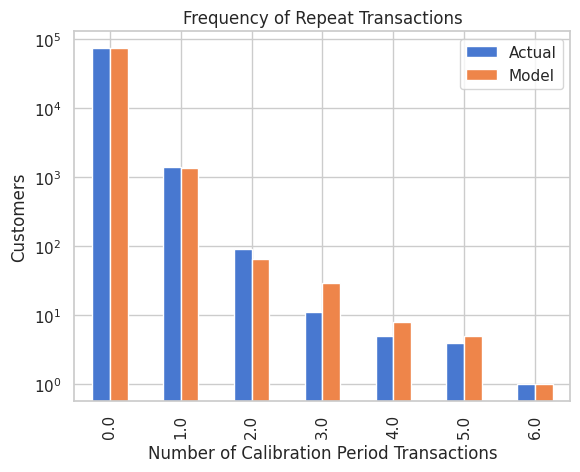

In [179]:
# Only calibration period
from lifetimes.plotting import plot_period_transactions

fig = plt.figure(figsize=(12,8))
ax = plot_period_transactions(bgf_val)
ax.set_yscale('log')

<Axes: title={'center': 'Actual Purchases in Holdout Period vs Predicted Purchases'}, xlabel='Purchases in calibration period', ylabel='Average of Purchases in Holdout Period'>

<Figure size 1200x800 with 0 Axes>

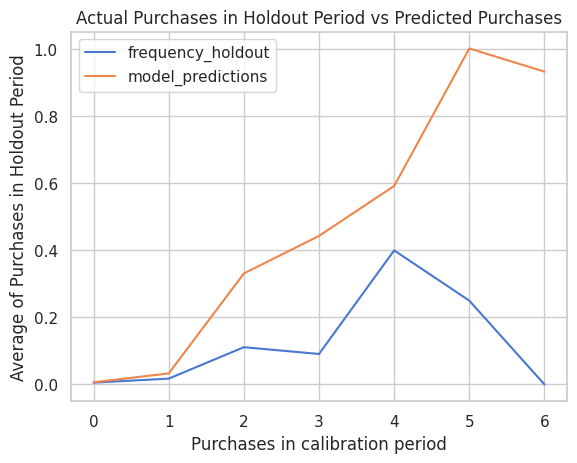

In [180]:
# Predict frequency of orders in the holdout period.
# X axis: Calibration period purchases. Y axis: Hold out period purchases.
# The blue and orange (model preds) should overlap for a good model.
# Both lines being in diagonal indicates, the behaviour and holdout and calib periods are similar.

from lifetimes.plotting import plot_calibration_purchases_vs_holdout_purchases

fig = plt.figure(figsize=(12,8))
plot_calibration_purchases_vs_holdout_purchases(model=bgf_val, calibration_holdout_matrix=rfm_val)

In [181]:
rfm_gg = rfm[rfm['frequency'] > 0]
len(rfm_gg)

2015

In [182]:
rfm_gg[['monetary_value', 'frequency']].corr()

,monetary_value,frequency
monetary_value,1.000000,0.002335
frequency,0.002335,1.000000


In [183]:
from lifetimes import GammaGammaFitter

ggf = GammaGammaFitter(penalizer_coef = 0.0)
ggf.fit(rfm_gg['frequency'], rfm_gg['monetary_value'])
print(ggf)

<lifetimes.GammaGammaFitter: fitted with 2015 subjects, p: 5.83, q: 2.83, v: 47.69>


In [184]:
# predicted average order value for each customer.
rfm['avg_transaction'] = round(ggf.conditional_expected_average_profit(rfm_gg['frequency'],
                                                                       rfm_gg['monetary_value']), 2)

rfm['avg_transaction'] = rfm['avg_transaction'].fillna(0)
rfm.sort_values(by='avg_transaction', ascending=False)

,frequency,recency,T,monetary_value,expected_4week,expected_8week,expected_12week,prob_alive,predicted_purchases_12,avg_transaction
customer_unique_id,,,,,,,,,,
c8460e4251689ba205045f3ea17884a1,1.0,1.0,22.0,2405.28,0.01,0.01,0.01,0.120106,0.014800,1868.33
a1044dd75b74fbc485b040575a14acf0,1.0,8.0,260.0,1650.18,0.00,0.00,0.00,0.040403,0.001462,1293.20
012a218df8995d3ec3bb221828360c86,1.0,42.0,114.0,1435.97,0.00,0.00,0.01,0.096973,0.006192,1130.05
da1e7179b9c5a1494d78528cbcf05aa0,1.0,174.0,467.0,1391.79,0.00,0.00,0.00,0.073540,0.001649,1096.40
6e26bbeaa107ec34112c64e1ee31c0f5,1.0,182.0,421.0,1376.45,0.00,0.00,0.00,0.082341,0.002017,1084.72
...,...,...,...,...,...,...,...,...,...,...
5618c13afa9188bbe93a11dff76f3659,0.0,0.0,65.0,0.00,0.00,0.00,0.00,1.000000,0.001390,0.00
56182a3fa247eeb071d511e046fa5309,0.0,0.0,510.0,0.00,0.00,0.00,0.00,1.000000,0.000340,0.00
56181f89940ab3c08ebc6e7749ec6f3d,0.0,0.0,494.0,0.00,0.00,0.00,0.00,1.000000,0.000350,0.00


In [185]:
# CLTV Caluclation for 6 Months
rfm['CLV'] = round(ggf.customer_lifetime_value(bgf,
                                               rfm['frequency'],
                                               rfm['recency'], rfm['T'], rfm['monetary_value'],
                                               time=26, discount_rate=0.01, freq='W'))  # 26 weeks

rfm = rfm.sort_values(by='CLV', ascending=False)# CLTV Caluclation for 6 Months
rfm['CLV'] = round(ggf.customer_lifetime_value(bgf,
                                               rfm['frequency'],
                                               rfm['recency'], rfm['T'], rfm['monetary_value'],
                                               time=26, discount_rate=0.01, freq='W'))  # 26 weeks

rfm = rfm.sort_values(by='CLV', ascending=False)

In [186]:
clusters = rfm.drop(rfm.iloc[:, 0:4], axis=1)
clusters.drop(columns=['prob_alive', 'predicted_purchases_12'], inplace=True)
clusters.head()

,expected_4week,expected_8week,expected_12week,avg_transaction,CLV
customer_unique_id,,,,,
397b44d5bb99eabf54ea9c2b41ebb905,0.03,0.06,0.08,458.08,304.0
fe81bb32c243a86b2f86fbf053fe6140,0.03,0.07,0.10,365.11,286.0
4facc2e6fbc2bffab2fea92d2b4aa7e4,0.02,0.04,0.06,496.44,235.0
297ec5afd18366f5ba27520cc4954151,0.02,0.03,0.05,626.92,222.0
c8460e4251689ba205045f3ea17884a1,0.01,0.01,0.01,1868.33,193.0


In [187]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled = scaler.fit_transform(clusters)
scaled

array([[ 3.90026275e+01,  3.94643508e+01,  3.50034930e+01,
         1.60275509e+01,  1.00944316e+02],
       [ 3.90026275e+01,  4.60483602e+01,  4.37659344e+01,
         1.27513348e+01,  9.49464094e+01],
       [ 2.59907873e+01,  2.62963320e+01,  2.62410516e+01,
         1.73793380e+01,  7.79523414e+01],
       ...,
       [-3.28930266e-02, -3.97056170e-02, -4.62727340e-02,
        -1.14958299e-01, -3.53658271e-01],
       [-3.28930266e-02, -3.97056170e-02, -4.62727340e-02,
        -1.14958299e-01, -3.53658271e-01],
       [-3.28930266e-02, -3.97056170e-02, -4.62727340e-02,
        -1.14958299e-01, -3.53658271e-01]])

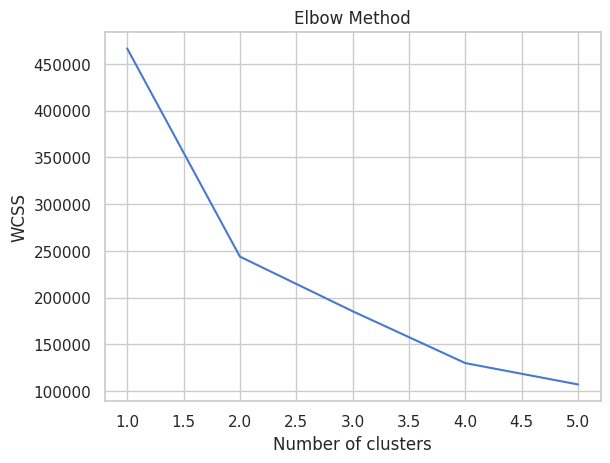

In [188]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 6):
    kmeans = KMeans(n_clusters=i, max_iter=1000, random_state=0)
    kmeans.fit(scaled)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 6), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [189]:
model = KMeans(n_clusters = 3, max_iter = 1000)
model.fit(scaled)
labels = model.labels_

In [190]:
model = KMeans(n_clusters = 3, max_iter = 1000)
model.fit(scaled)
labels = model.labels_

In [193]:
from sklearn.decomposition import PCA

features = ["expected_4week", "expected_8week", "expected_12week", "avg_transaction", "CLV"]

pca = PCA(n_components=2)
components = pca.fit_transform(clusters[features])
npc = np.array(components)
dfc = pd.DataFrame(npc, columns=['PC1','PC2'])
dfc = dfc.set_index(clusters.index)

# Assuming 'labels' from your KMeans model contains cluster assignments:
dfc['label'] = labels  # Use the 'labels' variable instead of clusters['cluster']

dfc

,PC1,PC2,label
customer_unique_id,,,
397b44d5bb99eabf54ea9c2b41ebb905,468.413093,281.460885,1
fe81bb32c243a86b2f86fbf053fe6140,374.706630,267.803691,1
4facc2e6fbc2bffab2fea92d2b4aa7e4,503.522941,210.751703,1
297ec5afd18366f5ba27520cc4954151,633.257257,191.698150,1
c8460e4251689ba205045f3ea17884a1,1871.975717,105.001176,1
...,...,...,...
992143aff0c52bffd8d709bd00f57465,-3.308026,-0.908497,0
2c693e71cc2c3b66b36ecf55c7668f49,-3.308026,-0.908497,0
99232d8066fef1bfa92bdab71d0097ef,-3.308026,-0.908497,0


<Axes: xlabel='PC1', ylabel='PC2'>

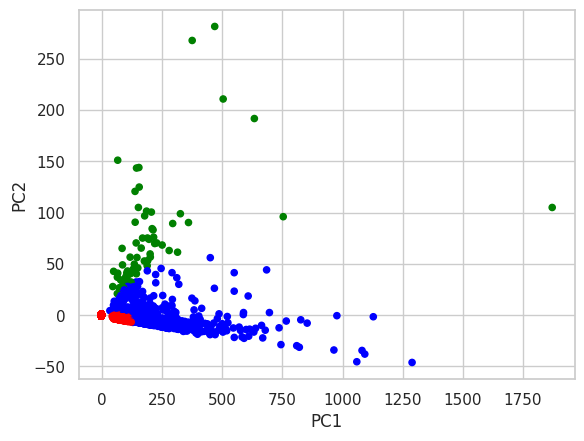

In [194]:
dfc.plot(x="PC1", y="PC2", kind="scatter", color=dfc.label.map({0:'red', 1:'green', 2:'blue'}))

In [196]:
clusters['cluster'] = labels  # Assign the cluster labels to a new column named 'cluster'

clusters.groupby('cluster').agg(['max','min','mean'])['CLV']  # Now this line should work

,max,min,mean
cluster,,,
0,4.0,0.0,0.928427
1,304.0,25.0,87.666667
2,78.0,0.0,7.112199


In [197]:
clusters['cluster'].replace(to_replace=[0,1,2], value = ['Non-Profitable', 'Very Profitable', 'Profitable'], inplace=True)
clusters.sort_values(by='CLV', ascending=False)

,expected_4week,expected_8week,expected_12week,avg_transaction,CLV,cluster
customer_unique_id,,,,,,
397b44d5bb99eabf54ea9c2b41ebb905,0.03,0.06,0.08,458.08,304.0,Very Profitable
fe81bb32c243a86b2f86fbf053fe6140,0.03,0.07,0.10,365.11,286.0,Very Profitable
4facc2e6fbc2bffab2fea92d2b4aa7e4,0.02,0.04,0.06,496.44,235.0,Very Profitable
297ec5afd18366f5ba27520cc4954151,0.02,0.03,0.05,626.92,222.0,Very Profitable
c8460e4251689ba205045f3ea17884a1,0.01,0.01,0.01,1868.33,193.0,Very Profitable
...,...,...,...,...,...,...
76fa7a3d20729ce3f3ef2088d6f81e37,0.00,0.00,0.00,0.00,0.0,Non-Profitable
11a40baf46bd96289d1f0936dae9a256,0.00,0.00,0.00,0.00,0.0,Non-Profitable
11a3ebf9df2955bc0963bc4b6c629086,0.00,0.00,0.00,0.00,0.0,Non-Profitable
